In [243]:
from load_modules import *
from scipy.ndimage import gaussian_filter
import my_config
import time
# conda create --name tf_gpu tensorflow-gpu
# conda activate tf_gpu
# pip install pandas scikit-learn matplotlib colorspacious ipykernel
# pip install opencv-python pandas scikit-learn matplotlib colorspacious 
# os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"

In [244]:
if my_config.USE_GPU:
    physical_devices = tf.config.list_physical_devices('GPU')
    #set memory amount to half of GPU
    if len(physical_devices) > 0:
        for device in physical_devices:
            print("Device:", device)
    else:
        print("No GPU devices found.")
    # Set GPU memory growth
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
                
        except RuntimeError as e:
            print(e)
        # Set environment variable for GPU memory allocation

    # Test for GPU device name
    name = tf.test.gpu_device_name()
    if name != '/device:GPU:0':
        raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(name))
    # Print the number of available GPUs
    print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
else:
    print("No GPU")

No GPU


In [245]:
# image_paths = os.listdir(r"models_4k")
# base_path = r"models_4k"

# all_model_paths = []
# print(my_config.IMAGE_FOLDER)
# print(my_config.ENCODER_PATH)
# print(my_config.DECODER_PATH)

# encoder = load_model(r"TrainedModels/316/encoder.h5")
# encoder = load_model(r"TrainedModels/no_duplicates_75_2_mask/decoder.h5")

# decoder = load_model(r"TrainedModels/316/decoder.h5")
# decoder = load_model(r"TrainedModels/no_duplicates_75_2_mask/decoder.h5")
# print("Encoder summary:" + str(encoder.summary()))
# print("Decoder summary:" + str(decoder.summary()))
# def encode(img):
#     #make sure image is in correct format 2048x2048x3
#     # img = Image.fromarray(img).resize((2048, 2048))
#     img = np.asarray(img).reshape(-1,3).astype('float32')
#     # pred_maps = encoder.predict(image)
#     start = time.time()
#     pred_maps = None
#     # with tf.device('/device:GPU:0'):
#     #     pred_maps = encoder.predict_on_batch(image)
#     pred_maps = encoder.predict(img)
#     #convert to numpy array
#     # pred_maps = np.array(pred_maps)
#     end = time.time()
#     elapsed = end - start
#     return pred_maps, elapsed
 
# def decode(encoded):
#     # recovered = decoder.predict(encoded)
#     start = time.time()
#     recovered = None
#     # with tf.device('/device:GPU:0'):
#     #     recovered = decoder.predict_on_batch(encoded)
#     recovered = decoder.predict(encoded)

#     end = time.time()
#     # recovered = np.array(recovered).reshape((2048, 2048, 3))
#     elapsed = end - start
#     # recovered = np.clip(recovered, 0, 1)
#     return recovered, elapsed

# def calculate_deltaE(original, recovered):  # assuming this function is defined
#     WIDTH = original.shape[0]
#     HEIGHT = original.shape[1]
#     # Convert the images to the CAM02-UCS color space and calculate the delta E loss
#     if original.shape[0] != recovered.shape[0] or original.shape[1] != recovered.shape[1]:
#         print("original shape:", original.shape)
#         print("recovered shape:", recovered.shape)
#         print("original and recovered shape do not match")
#         original = original.reshape((WIDTH, HEIGHT, 3))
#         recovered = recovered.reshape((WIDTH, HEIGHT, 3))
#     original_lab = colorspacious.cspace_convert(np.array(original), 'sRGB1', 'CAM02-UCS').reshape((WIDTH,HEIGHT,3))
#     recovered_lab = colorspacious.cspace_convert(np.array(recovered), 'sRGB1', 'CAM02-UCS').reshape((WIDTH,HEIGHT,3))
#     delta_e = np.sqrt(np.sum((original_lab - recovered_lab)**2, axis=2))
#     # Plot the delta E loss in the third subplot
#     return delta_e

# def mean_squared_dif(map1, map2):
#     dif = np.sqrt(np.sum((map1 - map2)**2, axis=1))
#     return dif
# def age_mel(v, t, r=0.08):
#     """
#     v is original volume fraction of melanin
#     t is number of decades
#     r is rate of decline (typical is 8%)
#     """
#     v_prime = v-(t*r)*v
#     return v_prime

# def age_hem(v, t, r_Hbi=0.06, r_Hbe=0.1, zeta=0.5):
#     """
#     v is original volume fraction of hemoglobin
#     t is number of decades
#     r is rate of decline (typical is 6%)
#     """
#     v_prime = v-t*(r_Hbi+zeta*r_Hbe)*v
#     return v_prime

In [246]:
image_paths = os.listdir(r"models_4k")
images = []
names = []
for image_path in image_paths:
    folder_name = image_path.split('.')[0]
    names.append(folder_name)
    image_path = os.path.join(my_config.IMAGE_FOLDER, image_path)
    image = Image.open(image_path).convert('RGB')
    image = np.array(image)
    if np.max(image) > 1:
        image = image/255.0
    images.append(image)
print(names)
all_model_paths = []
encoder = load_model(r"TrainedModels/316/encoder.h5")
decoder = load_model(r"TrainedModels/316/decoder.h5")
# encoder = load_model(r"/Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/TrainedModels/no_duplicates_75_2_mask/encoder.h5")
# decoder = load_model(r"/Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/TrainedModels/no_duplicates_75_2_mask/decoder.h5")

def encode(img):
    image = np.asarray(img).reshape(-1,3)
    # pred_maps = encoder.predict(image)
    start = time.time()
    pred_maps = None
    with tf.device('/device:GPU:0'):
        pred_maps = encoder.predict_on_batch(image)
    end = time.time()
    elapsed = end - start
    return pred_maps, elapsed
 
def decode(encoded):
    # recovered = decoder.predict(encoded)
    start = time.time()
    recovered = None
    with tf.device('/device:GPU:0'):
        recovered = decoder.predict_on_batch(encoded)
    end = time.time()
    elapsed = end - start
    # recovered = np.clip(recovered, 0, 1)
    return recovered, elapsed
def calculate_deltaE(original, recovered):  # assuming this function is defined
    WIDTH = original.shape[0]
    HEIGHT = original.shape[1]
    # Convert the images to the CAM02-UCS color space and calculate the delta E loss
    if original.shape[0] != recovered.shape[0] or original.shape[1] != recovered.shape[1]:
        print("original shape:", original.shape)
        print("recovered shape:", recovered.shape)
        print("original and recovered shape do not match")
        original = original.reshape((WIDTH, HEIGHT, 3))
        recovered = recovered.reshape((WIDTH, HEIGHT, 3))
    original_lab = colorspacious.cspace_convert(np.array(original), 'sRGB1', 'CAM02-UCS').reshape((WIDTH,HEIGHT,3))
    recovered_lab = colorspacious.cspace_convert(np.array(recovered), 'sRGB1', 'CAM02-UCS').reshape((WIDTH,HEIGHT,3))
    delta_e = np.sqrt(np.sum((original_lab - recovered_lab)**2, axis=2))
    # Plot the delta E loss in the third subplot
    return delta_e


def mean_squared_dif(map1, map2):
    dif = np.sqrt(np.sum((map1 - map2)**2, axis=1))
    return dif
def age_mel(v, t, r=0.08):
    """
    v is original volume fraction of melanin
    t is number of decades
    r is rate of decline (typical is 8%)
    """
    v_prime = v-(t*r)*v
    return v_prime

def age_hem(v, t, r_Hbi=0.06, r_Hbe=0.1, zeta=0.5):
    """
    v is original volume fraction of hemoglobin
    t is number of decades
    r is rate of decline (typical is 6%)
    """
    v_prime = v-t*(r_Hbi+zeta*r_Hbe)*v
    return v_prime

['m46_4k', 'metina', 'm64_4k', 'm98_4k', 'm141_4k', 'm53_4k', 'm32']


In [247]:
# hem_mask_path = r"sunspots/hem_mask.png"
# mel_mask_path = r"sunspots/melmask2.png"
# eye_mask_path = r"sunspots/eye_mask.png"
# eye_lip_mask_path = r"sunspots/eye_lip_mask.png"



# hem_mask = cv2.imread(hem_mask_path, cv2.IMREAD_GRAYSCALE) 
# mel_mask = cv2.imread(mel_mask_path, cv2.IMREAD_GRAYSCALE)
# eye_lip_mask = cv2.imread(eye_lip_mask_path, cv2.IMREAD_GRAYSCALE)
# #expand masked area of eye mask
# # eye_lip_mask_path = cv2.dilate(eye_lip_mask_path, np.ones((45, 55), np.uint8), iterations=1)
# #shrink masked area of eye mask
# # eye_mask = cv2.erode(eye_mask, np.ones((5,5), np.uint8), iterations=4)

# #reshape to 4096x4096
# hem_mask = cv2.resize(hem_mask, (4096, 4096))/255.0
# mel_mask = cv2.resize(mel_mask, (4096, 4096))/255.0
# eye_lip_mask = cv2.resize(eye_lip_mask, (4096, 4096))/255.0


# mel_mask = np.array(mel_mask)
# eye_lip_mask = np.array(eye_lip_mask)
# eye_lip_mask = gaussian_filter(eye_lip_mask, sigma=5)
# # eye_mask = gaussian_filter(eye_mask, sigma=20)
# #add gaussian blur to eye mask
# # eye_mask = cv2.GaussianBlur(eye_mask, ksize=5, sigmaX=50, sigmaY=50)
# hem_mask = 1 - hem_mask 
# mel_mask = 1 - mel_mask
# eye_lip_mask = eye_lip_mask
# #make eye lip mask bniary

# # hem_mask = cv2.bitwise_xor(hem_mask, eye_mask)
# # mel_mask = cv2.bitwise_xor(mel_mask, eye_lip_mask)

# #clamp 0 to 1


# #threshold

# plt.imshow(hem_mask, cmap='gray')
# plt.show()
# plt.imshow(mel_mask, cmap='gray')
# plt.show()
# plt.imshow(eye_lip_mask, cmap="gray")
# plt.show()
# print(f"min {np.min(mel_mask)} mean {np.mean(mel_mask)} max {np.max(mel_mask)}")

# print(f"min {np.min(hem_mask)} mean {np.mean(hem_mask)} max {np.max(hem_mask)}")

In [248]:
# # fig,ax = plt.subplots(5,5, figsize=(16,14))
# subjects_meta = ['m141_4k', 'm46_4k', 'm53_4k', 'm64_4k', 'm98_4k', 'metina.png']
# idx = 0
# # hem_mask_path = r"m32_Ch.png"
# # mel_mask_path = r"m32_Cm.png"
# # hem_mask = cv2.imread(hem_mask_path, cv2.IMREAD_GRAYSCALE)/255.0 
# # mel_mask = cv2.imread(mel_mask_path, cv2.IMREAD_GRAYSCALE)/255.0
# # hem_mask = np.array(hem_mask)
# # mel_mask = np.array(mel_mask)


# print(f"shape of hem_mask: {hem_mask.shape}")
# #reshape to 4096x4096
# # hem_mask = np.resize(hem_mask, (4096,4096))
# # mel_mask = np.resize(mel_mask, (4096,4096))
# #convert to binary

# for image, folder_name in zip(images, names):

#     idx += 1
#     WIDTH = image.shape[0]
#     HEIGHT = image.shape[1]
#     image = np.asarray(image)
#     image_numpy = image.reshape((WIDTH, HEIGHT, 3))
#     pred_maps, encode_time = encode(image_numpy)

#     #melanin
#     print(f"Cm min { np.min(pred_maps[:,0])} mean {np.mean(pred_maps[:,0])} max {np.max(pred_maps[:,0])}")
#     pred_maps[:,0] = np.where(eye_lip_mask.reshape(-1)  > 0.7, age_mel(pred_maps[:,0],1), age_mel(pred_maps[:,0],1)+0.15*mel_mask.reshape(-1) )
#     # pred_maps[:,0] = np.asarray(age_mel(pred_maps[:,0]-0.2*eye_lip_mask.reshape(-1), 2)+0.1*mel_mask.reshape(-1,))
#     print(f"Cm min { np.min(pred_maps[:,0])} mean {np.mean(pred_maps[:,0])} max {np.max(pred_maps[:,0])}")

#     #hemoglobin
#     print(f"Ch min { np.min(pred_maps[:,1])} mean {np.mean(pred_maps[:,1])} max {np.max(pred_maps[:,1])}")
#     # pred_maps[:,1] *= 0.98
#     # pred_maps[:,1] = np.asarray(age_hem(pred_maps[:,1], 4))
#     pred_maps[:,1] = np.where(eye_lip_mask.reshape(-1)  < 0.5, age_hem(pred_maps[:,1], 3), pred_maps[:,1] )
#     pred_maps[:,1] += 0.1*hem_mask.reshape(-1,)
#     print(f"Ch min { np.min(pred_maps[:,1])} mean {np.mean(pred_maps[:,1])} max {np.max(pred_maps[:,1])}")

#     #melanin blend
#     print(f"Bm min { np.min(pred_maps[:,2])} mean {np.mean(pred_maps[:,2])} max {np.max(pred_maps[:,2])}")
#     pred_maps[:,2] *= 1.1
#     # pred_maps[:,2] += bm_mask.reshape(-1,)*0.02
#     print(f"Bm min { np.min(pred_maps[:,2])} mean {np.mean(pred_maps[:,2])} max {np.max(pred_maps[:,2])}")

#     #hemoglobin blend
#     print(f"Bh min { np.min(pred_maps[:,3])} mean {np.mean(pred_maps[:,3])} max {np.max(pred_maps[:,3])}")
#     pred_maps[:,3] *= 0.98
#     # pred_maps[:,3] = np.where(eye_lip_mask.reshape(-1)  > 0.5, pred_maps[:,3]*0.95, pred_maps[:,3]*0.99 )
#     # pred_maps[:,3] -= 0.1*bh_mask.reshape(-1,)
#     # pred_maps[:,3] += 0.2*mel_mask.reshape(-1,)
#     print(f"Bh min { np.min(pred_maps[:,3])} mean {np.mean(pred_maps[:,3])} max {np.max(pred_maps[:,3])}")

#     #t
#     print(f"T min { np.min(pred_maps[:,4])} mean {np.mean(pred_maps[:,4])} max {np.max(pred_maps[:,4])}")
#     pred_maps[:,4] *= 0.97
#     # pred_maps[:,4] += t_mask.reshape(-1,)*0.02
#     print(f"T min { np.min(pred_maps[:,4])} mean {np.mean(pred_maps[:,4])} max {np.max(pred_maps[:,4])}")

#     recovered, decode_time = decode(pred_maps)
#     print(f"shape of recovered: {recovered.shape}")
#     recovered = np.asarray(recovered).reshape((WIDTH, HEIGHT, 3))

#     # recovered_lab= colorspacious.cspace_convert(recovered, 'sRGB1', 'CAM02-UCS')
#     # recovered = np.asarray(decoded_increased_Cm).reshape((WIDTH, HEIGHT, 3))
#     plt.imshow(image)
#     plt.show()
#     plt.imshow(recovered)
#     plt.show()
#     #save the image 
#     #print size of image
#     print(f"size of image: {recovered.shape}")
#     #max min pixel values
#     print(f"max pixel value: {np.max(recovered)}")
#     print(f"min pixel value: {np.min(recovered)}")
#     #clamp the values to 0-1
#     recovered = np.clip(recovered, 0, 1)
#     # if filename contains()"m46":
#     if "m46" in folder_name:
#         print("m46")
#         #save the recovered image
#         plt.imsave(f"m46_recovered.png", recovered)
        

#         filename = f"{folder_name}_recovered.png"
#     # experiment_name = input("Enter experiment name: ")
#     # file_NAME = f"{experiment_name}_{subjects_meta[idx]}.png"
#     # plt.imsave(file_NAME, recovered)
#     idx += 1
    

In [249]:
# image_path = r"models_4k/m32.png"

# image = Image.open(image_path).convert('RGB')
# image = np.array(image)/255.0

# WIDTH = image.shape[0]
# HEIGHT = image.shape[1]
# image = np.asarray(image)
# image_numpy = image.reshape((WIDTH, HEIGHT, 3))
# pred_maps, encode_time = encode(image_numpy)

# # print(f"min { np.min(pred_maps[:,0])} mean {np.mean(pred_maps[:,0])} max {np.max(pred_maps[:,0])}")
# # pred_maps[:,0] = np.asarray(age_mel(pred_maps[:,0], 3)+0.1*mel_mask.reshape(-1,))
# # print(f"min { np.min(pred_maps[:,0])} mean {np.mean(pred_maps[:,0])} max {np.max(pred_maps[:,0])}")

# # pred_maps[:,1] = np.asarray(age_hem(pred_maps[:,1], 2)+0.025*hem_mask.reshape(-1,))
# # # pred_maps[:,0] *= 1.4
# # pred_maps[:,1] = np.asarray(pred_maps[:,1])

# # pred_maps[:,3] = np.asarray(0.9*age_hem(pred_maps[:,3], 2)+0.025*hem_mask.reshape(-1,))
# # pred_maps[:,3] *= 0.98

# # pred_maps[:,4] *= 0.98
# """
# Cm = pred_maps[:,0]
# Ch = pred_maps[:,1]
# """
# Cm = pred_maps[:,0].reshape(WIDTH, HEIGHT)
# plt.imshow(Cm, cmap='binary')   
# plt.title("Cm")
# plt.show()
# plt.imsave("Cm.png", Cm, cmap='binary')
# Ch = pred_maps[:,1].reshape(WIDTH, HEIGHT)
# plt.imshow(Ch, cmap='binary')
# plt.title("Ch")
# plt.show()
# plt.imsave("Ch.png", Ch, cmap='binary')
# Bm = pred_maps[:,2]
# plt.imshow(Bm.reshape(WIDTH, HEIGHT), cmap='binary')
# plt.title("Bm")
# plt.show()
# plt.imsave("Bm.png", Bm.reshape(WIDTH, HEIGHT), cmap='binary')
# Bh = pred_maps[:,3]
# plt.imshow(Bh.reshape(WIDTH, HEIGHT), cmap='binary')
# plt.title("Bh")
# plt.show()
# plt.imsave("Bh.png", Bh.reshape(WIDTH, HEIGHT), cmap='binary')
# T = pred_maps[:,4]
# plt.imshow(T.reshape(WIDTH, HEIGHT), cmap='binary')
# plt.title("T")
# plt.show()
# plt.imsave("T.png", T.reshape(WIDTH, HEIGHT), cmap='binary')



# recovered, decode_time = decode(pred_maps)
# print(f"shape of recovered: {recovered.shape}")
# recovered = np.asarray(recovered).reshape((WIDTH, HEIGHT, 3))

# # recovered_lab= colorspacious.cspace_convert(recovered, 'sRGB1', 'CAM02-UCS')
# # recovered = np.asarray(decoded_increased_Cm).reshape((WIDTH, HEIGHT, 3))
# plt.imshow(image)
# plt.show()
# plt.imshow(recovered)
# plt.show()
# #save the image 
# #print size of image
# print(f"size of image: {recovered.shape}")
# #max min pixel values
# print(f"max pixel value: {np.max(recovered)}")
# print(f"min pixel value: {np.min(recovered)}")
# #clamp the values to 0-1
# recovered = np.clip(recovered, 0, 1)
# # experiment_name = input("Enter experiment name: ")
# # file_NAME = f"{experiment_name}_{subjects_meta[idx]}.png"
# # plt.imsave(file_NAME, recovered)

    

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/1neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/1anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/1smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011362900957465172ch 0.005271056666970253cm 0.002319758292287588cm 0.0043842545710504055 cm 0.0021205598022788763


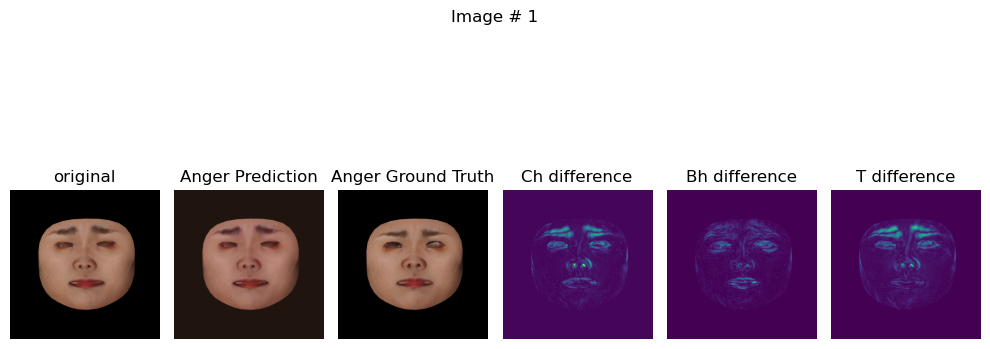

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/2neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/2anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/2smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010730845853686333ch 0.00576594565063715cm 0.002319758292287588cm 0.004730691201984882 cm 0.002580017549917102


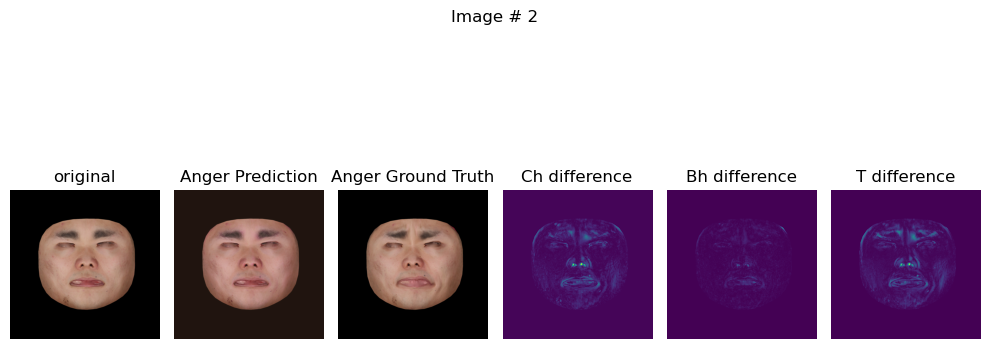

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/3neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/3anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/3smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008287024684250355ch 0.004564808681607246cm 0.002319758292287588cm 0.004117375239729881 cm 0.0017362008802592754


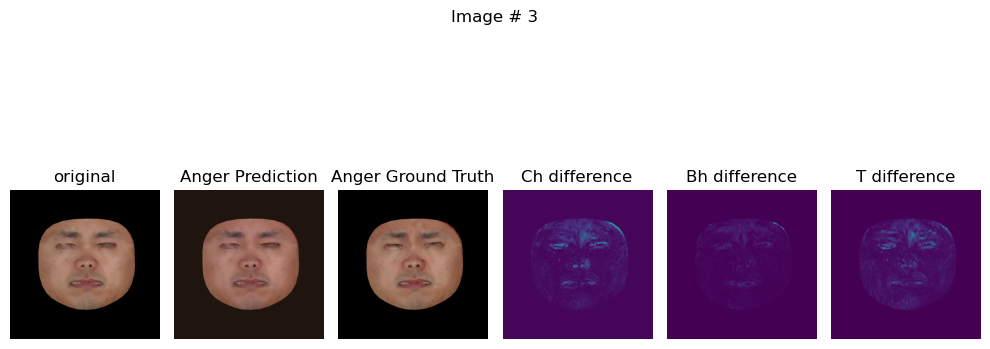

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/4neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/4anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/4smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009752757847309113ch 0.004596062935888767cm 0.002319758292287588cm 0.0035952215548604727 cm 0.0013308371417224407


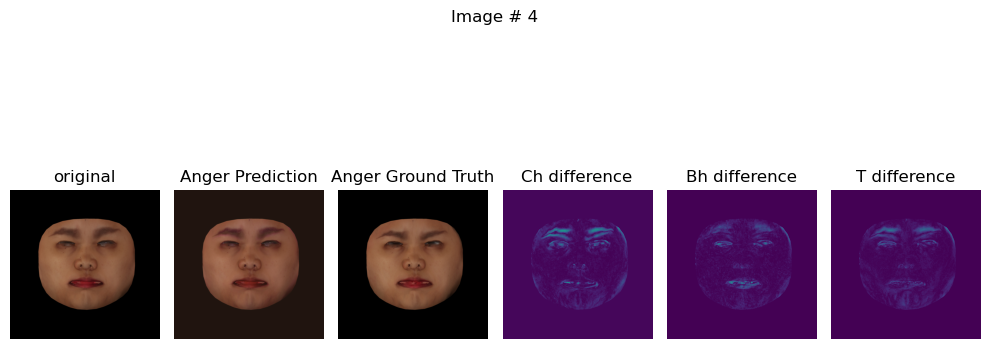

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/5neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/5anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/5smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007019305136054754ch 0.004272894002497196cm 0.002319758292287588cm 0.0036499961279332638 cm 0.0015437178080901504


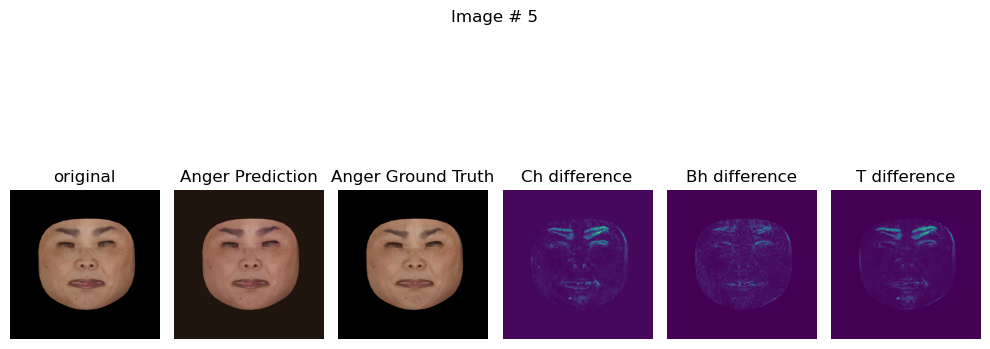

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/6neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/6anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/6smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010668468661606312ch 0.0050252629444003105cm 0.002319758292287588cm 0.004033963195979595 cm 0.0017829701537266374


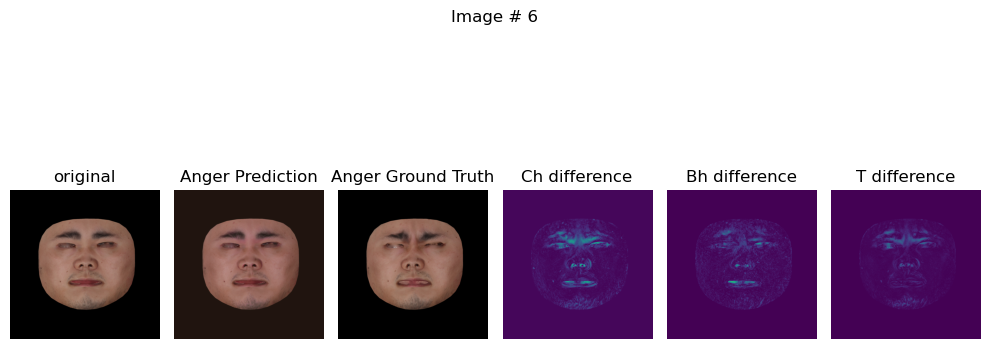

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/7neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/7anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/7smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009772825986146927ch 0.005063498392701149cm 0.002319758292287588cm 0.00427768612280488 cm 0.002052919240668416


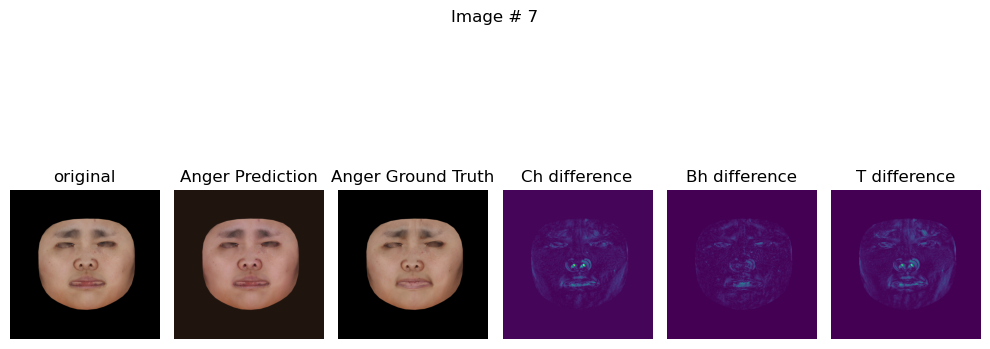

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/8neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/8anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/8smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009023171849548817ch 0.004278535954654217cm 0.002319758292287588cm 0.0032805586233735085 cm 0.001088008633814752


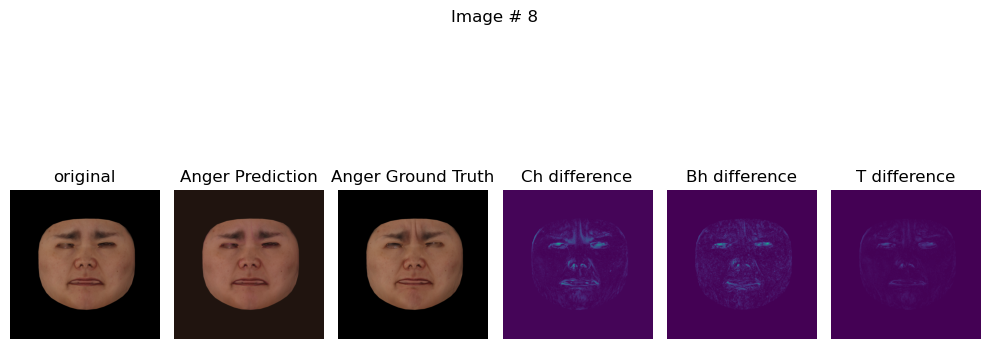

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/9neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/9anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/9smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011980009265244007ch 0.005864229053258896cm 0.002319758292287588cm 0.004306445829570293 cm 0.0026717318687587976


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


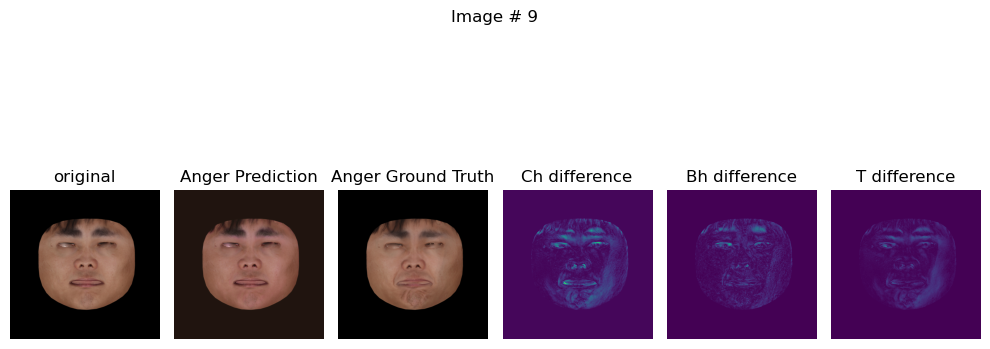

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/10neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/10anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/10smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008894072845578194ch 0.004472702741622925cm 0.002319758292287588cm 0.00373851228505373 cm 0.0013113260501995683


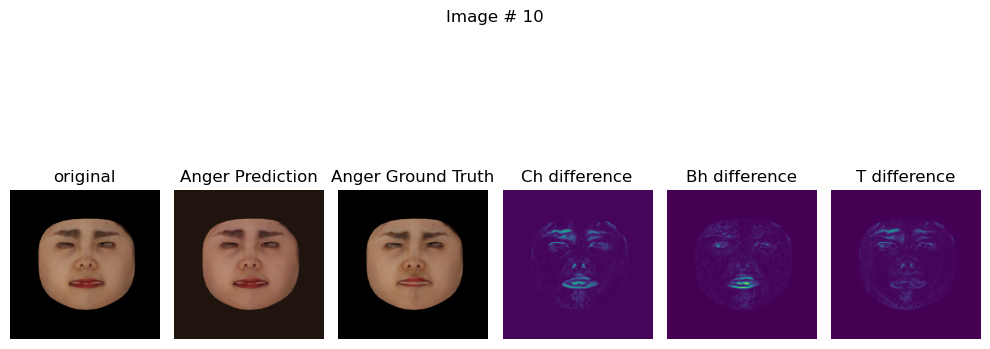

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/11neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/11anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/11smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.049090832471847534ch 0.02725845016539097cm 0.002319758292287588cm 0.06734149158000946 cm 0.02451038360595703


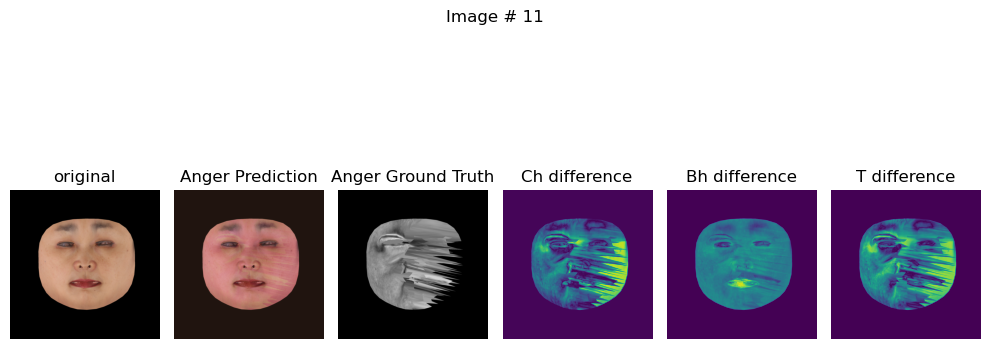

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/12neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/12anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/12smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.012280943803489208ch 0.006645560264587402cm 0.002319758292287588cm 0.007669716142117977 cm 0.0030382813420146704


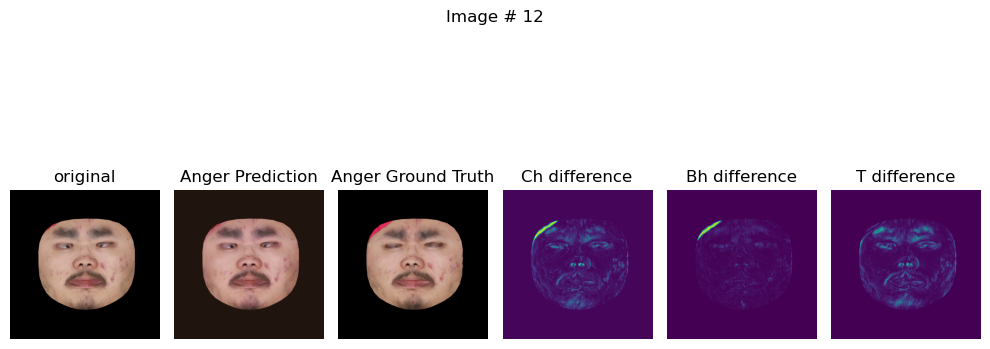

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/13neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/13anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/13smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010462393052875996ch 0.005067028105258942cm 0.002319758292287588cm 0.004027846269309521 cm 0.0018946703057736158


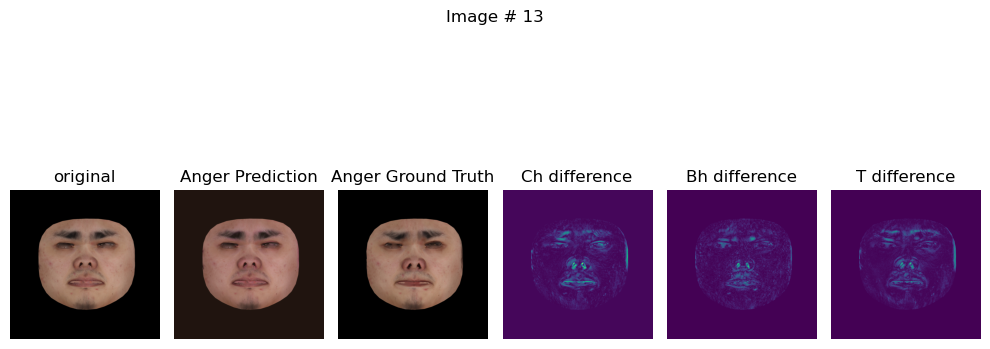

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/14neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/14anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/14smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009353083558380604ch 0.005537021905183792cm 0.002319758292287588cm 0.005360564682632685 cm 0.0025896483566612005


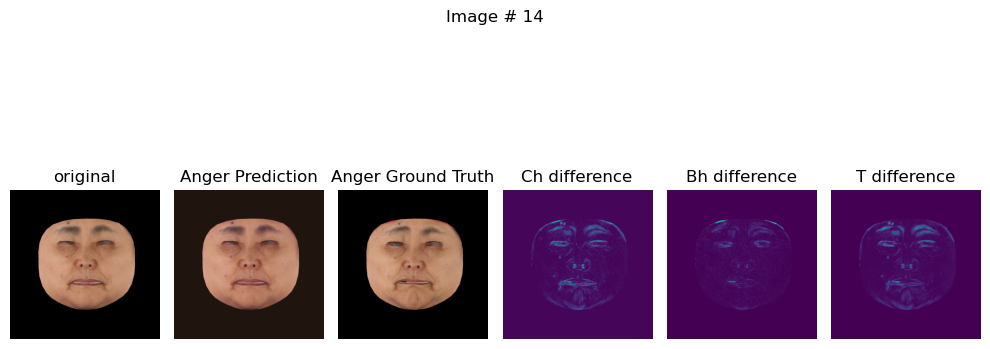

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/15neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/15anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/15smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011954154819250107ch 0.006025566719472408cm 0.002319758292287588cm 0.00572810648009181 cm 0.0029738787561655045


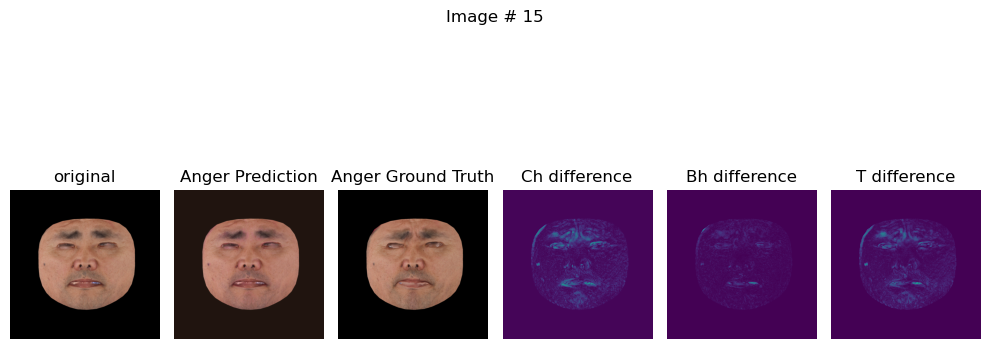

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/16neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/16anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/16smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007711558137089014ch 0.004681776277720928cm 0.002319758292287588cm 0.0032695890404284 cm 0.001665821298956871


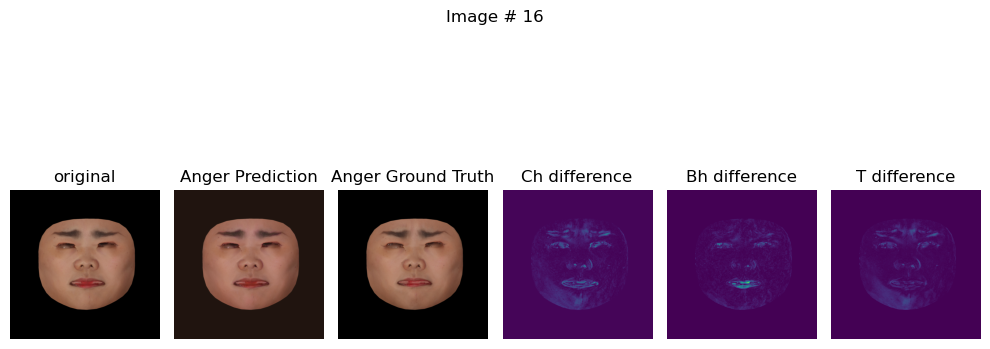

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/17neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/17anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/17smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.014092409051954746ch 0.005483351647853851cm 0.002319758292287588cm 0.006058386992663145 cm 0.0020196158438920975


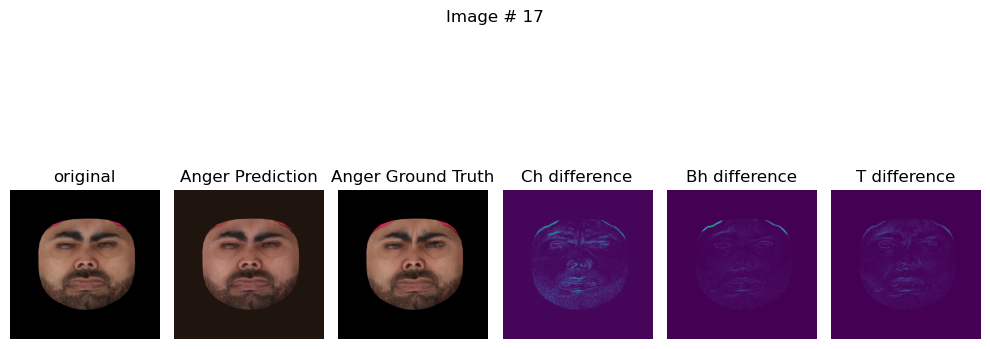

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/18neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/18anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/18smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007118181325495243ch 0.004645638167858124cm 0.002319758292287588cm 0.004011829383671284 cm 0.001705468283034861


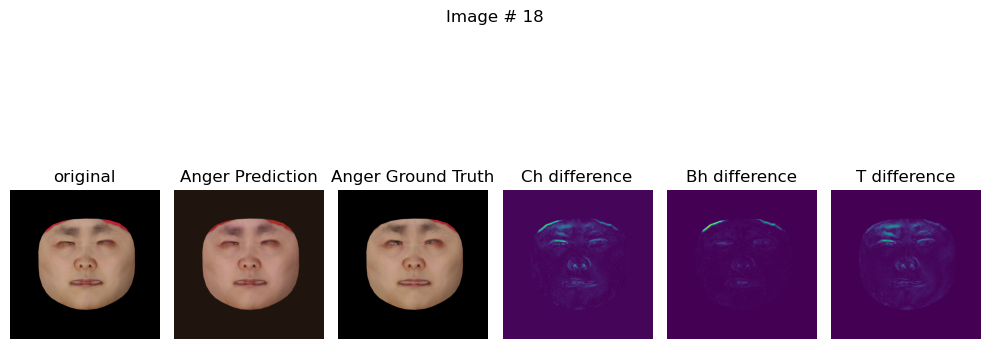

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/19neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/19anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/19smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.01002297643572092ch 0.004181080497801304cm 0.002319758292287588cm 0.0036737776827067137 cm 0.00106885377317667


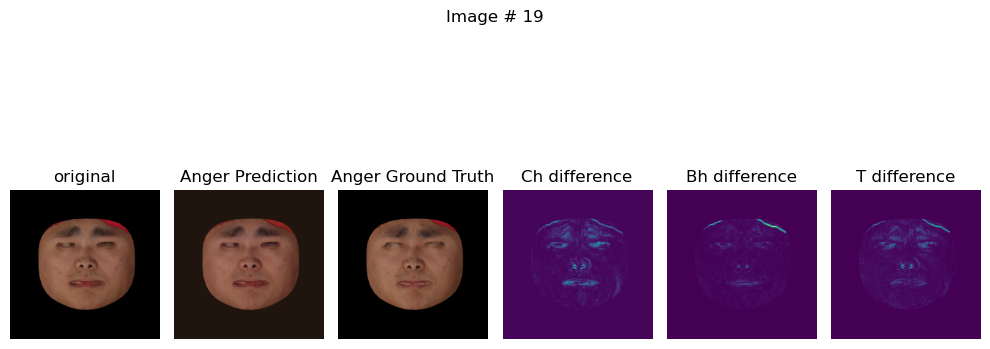

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/20neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/20anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/20smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.013252006843686104ch 0.006264406256377697cm 0.002319758292287588cm 0.005793394986540079 cm 0.0032848063856363297


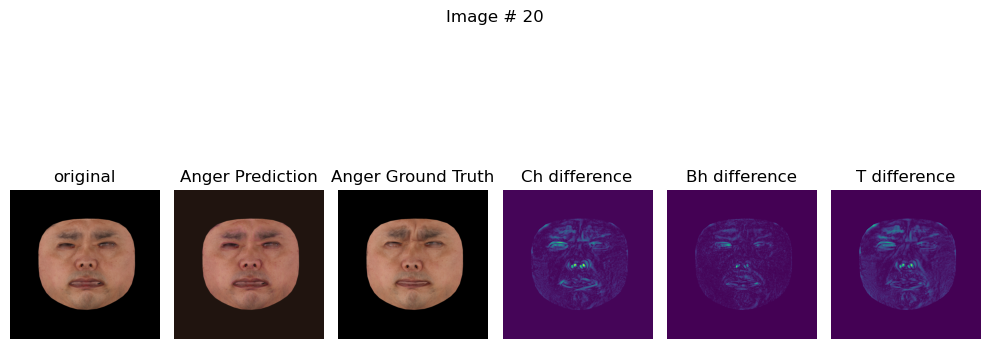

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/21neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/21anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/21smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008508975617587566ch 0.004059348255395889cm 0.002319758292287588cm 0.0036938560660928488 cm 0.0012027338379994035


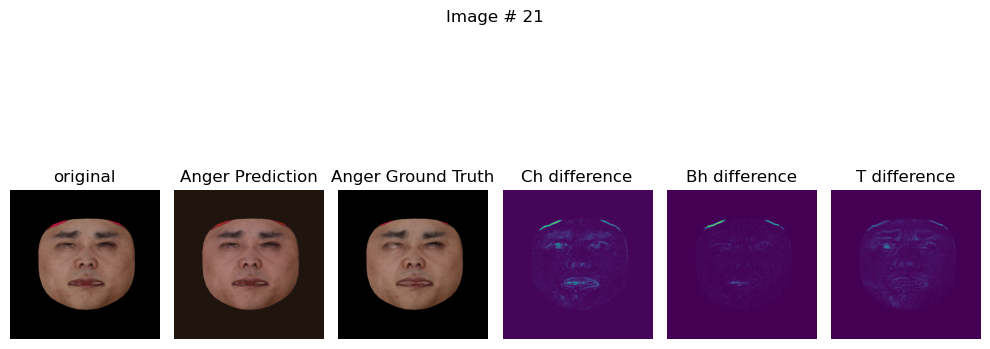

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/22neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/22anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/22smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008418593555688858ch 0.004009862430393696cm 0.002319758292287588cm 0.003445143811404705 cm 0.0011017085053026676


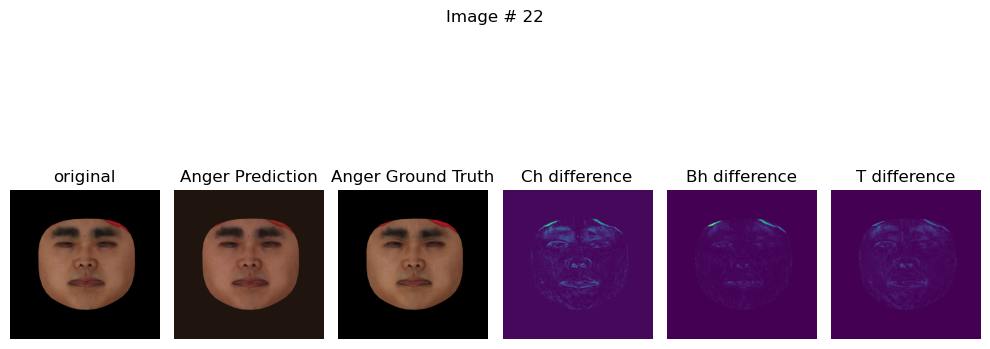

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/23neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/23anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/23smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.01699090749025345ch 0.0073483604937791824cm 0.002319758292287588cm 0.007484868168830872 cm 0.003152271267026663


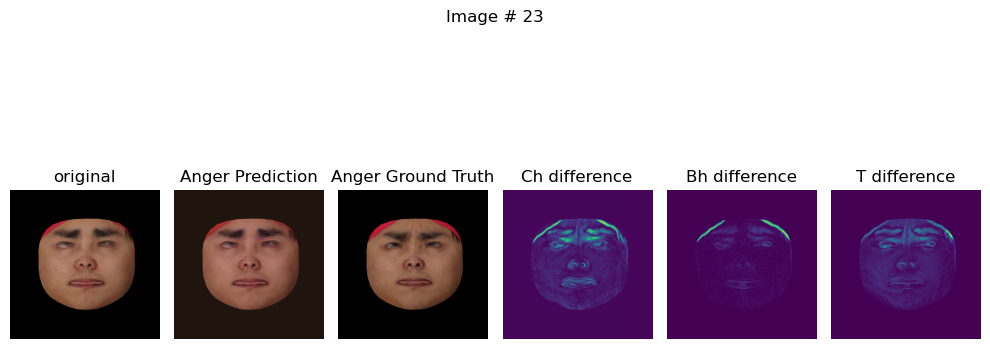

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/24neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/24anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/24smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.00918360985815525ch 0.004859485663473606cm 0.002319758292287588cm 0.0043130191043019295 cm 0.0016000471077859402


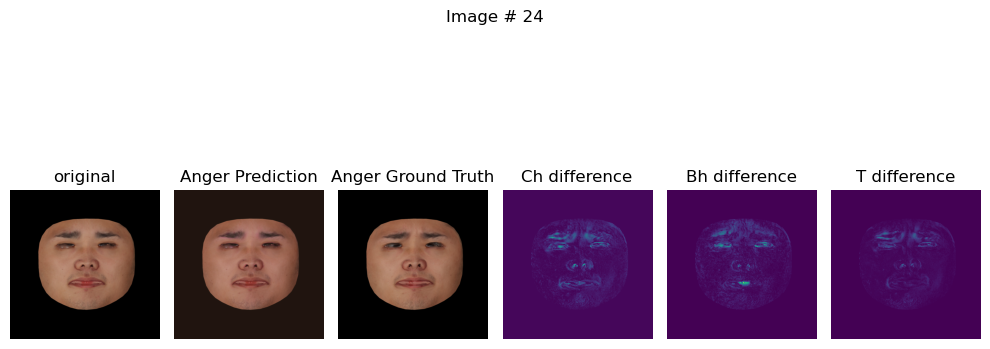

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/25neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/25anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/25smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007670172024518251ch 0.0044319843873381615cm 0.002319758292287588cm 0.004316375590860844 cm 0.0016473039286211133


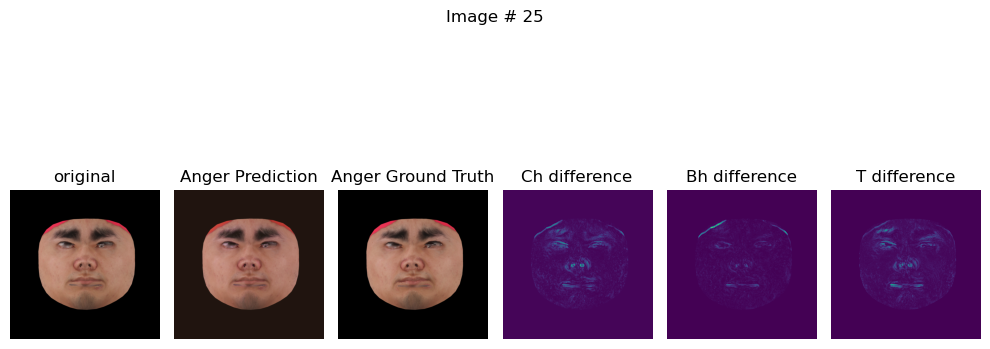

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/26neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/26anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/26smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.015048581175506115ch 0.005424154922366142cm 0.002319758292287588cm 0.0046059610322117805 cm 0.0016242724377661943


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


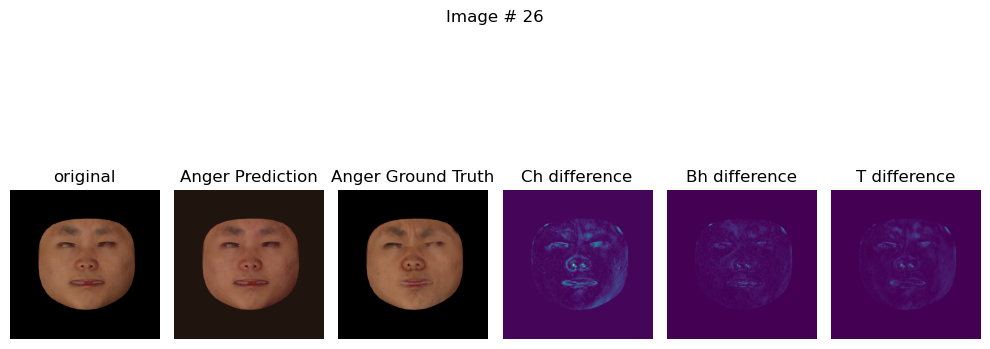

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/27neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/27anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/27smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009565613232553005ch 0.004544978030025959cm 0.002319758292287588cm 0.005991860292851925 cm 0.0015462392475456


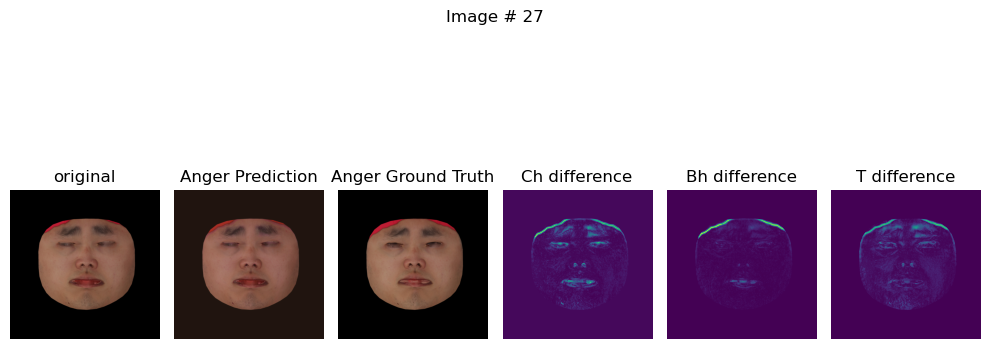

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/28neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/28anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/28smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009360568597912788ch 0.005350079387426376cm 0.002319758292287588cm 0.004919622093439102 cm 0.002404899103567004


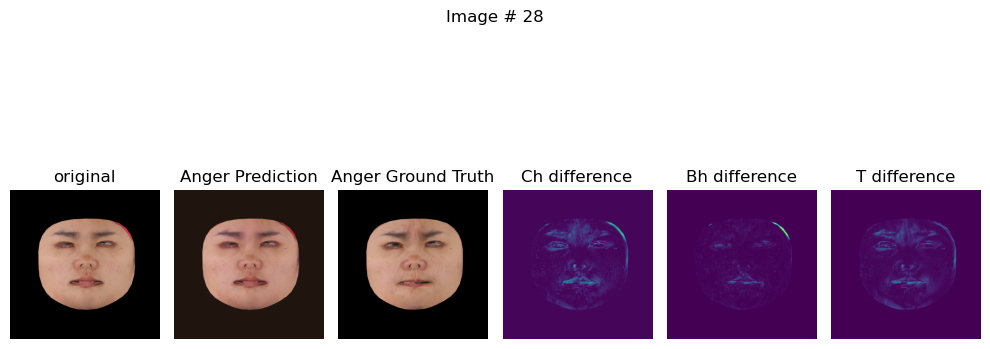

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/29neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/29anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/29smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.01130067277699709ch 0.005331931635737419cm 0.002319758292287588cm 0.0044231778010725975 cm 0.0023247713688760996


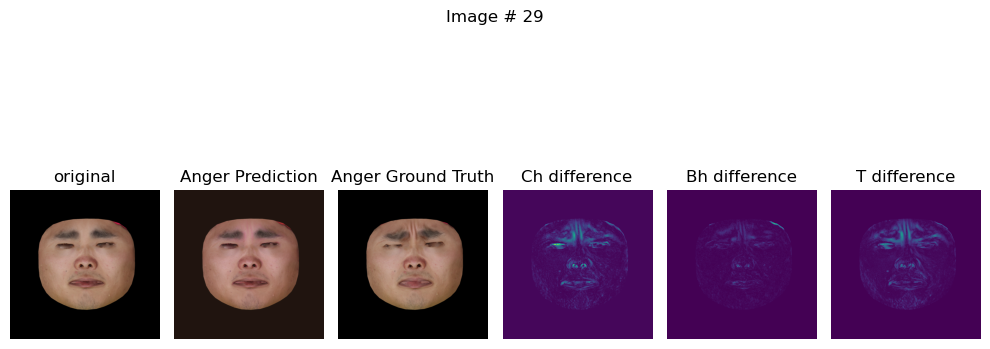

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/30neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/30anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/30smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008421560749411583ch 0.004725766368210316cm 0.002319758292287588cm 0.003725925926119089 cm 0.0021683748345822096


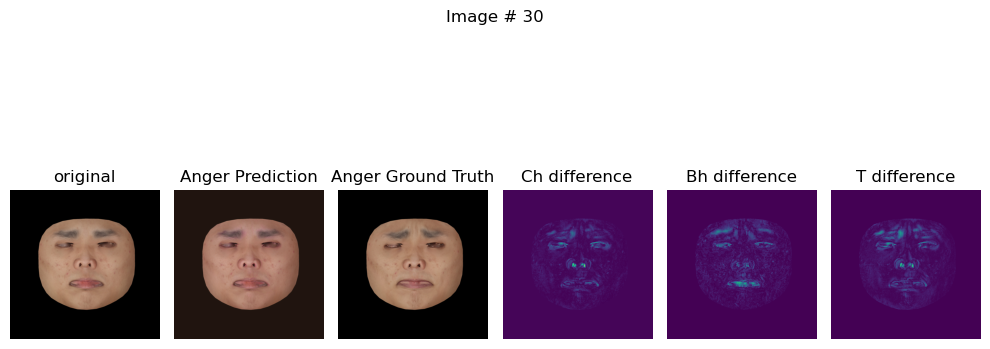

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/31neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/31anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/31smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008227174170315266ch 0.004746175371110439cm 0.002319758292287588cm 0.0046981447376310825 cm 0.001986238406971097


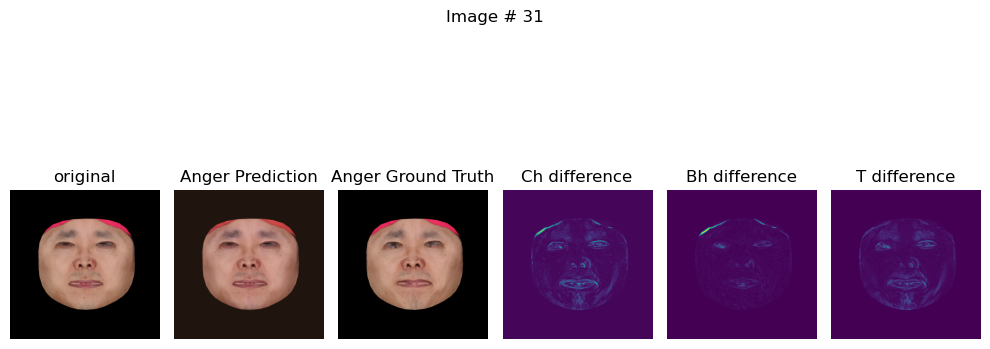

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/32neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/32anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/32smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009059770032763481ch 0.004696357995271683cm 0.002319758292287588cm 0.004522775299847126 cm 0.0019945467356592417


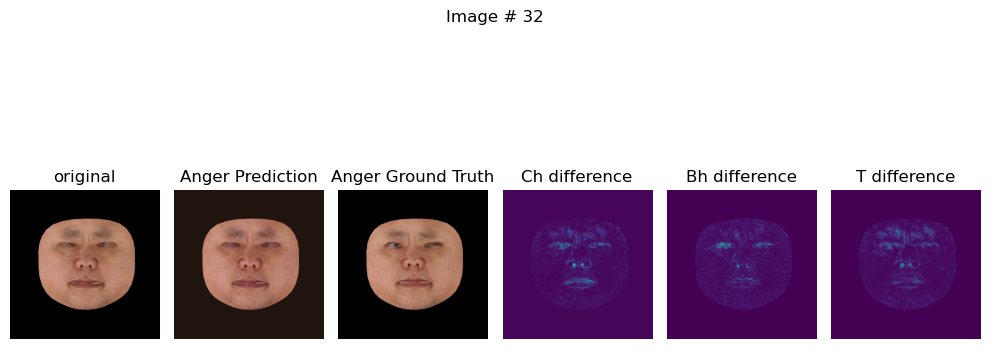

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/33neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/33anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/33smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.016025636345148087ch 0.005721104331314564cm 0.002319758292287588cm 0.0049564470537006855 cm 0.0019712045323103666


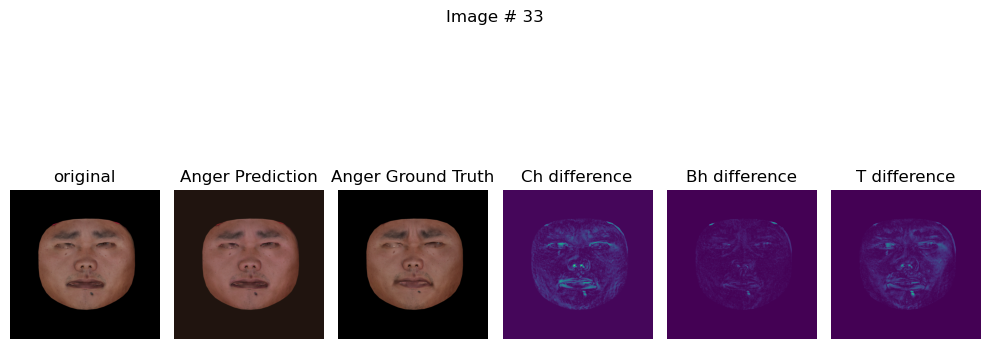

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/34neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/34anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/34smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008394659496843815ch 0.004521516151726246cm 0.002319758292287588cm 0.003925735130906105 cm 0.0019010695395991206


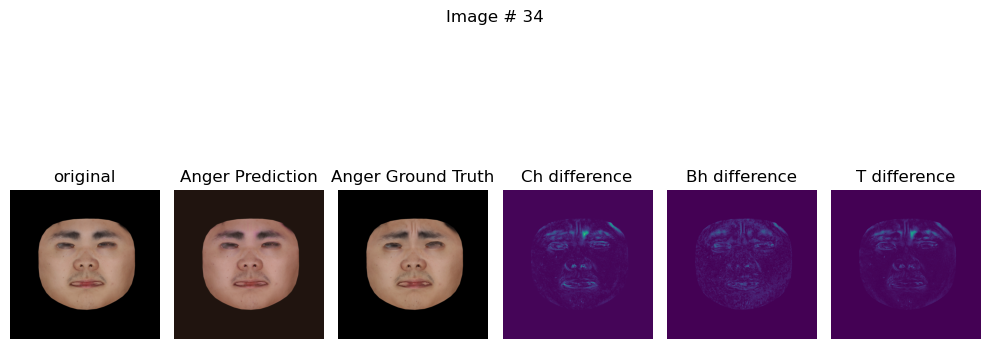

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/35neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/35anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/35smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.012121414765715599ch 0.005750053562223911cm 0.002319758292287588cm 0.004886352922767401 cm 0.0024741042871028185


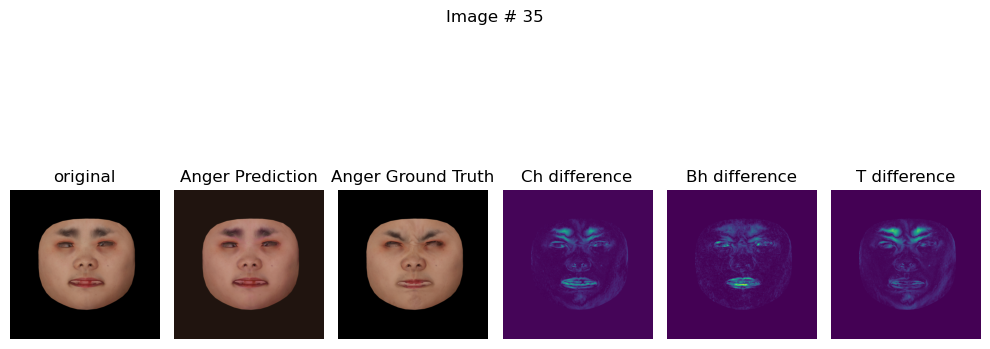

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/36neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/36anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/36smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.015303310938179493ch 0.006069064140319824cm 0.002319758292287588cm 0.005530394148081541 cm 0.001535420073196292


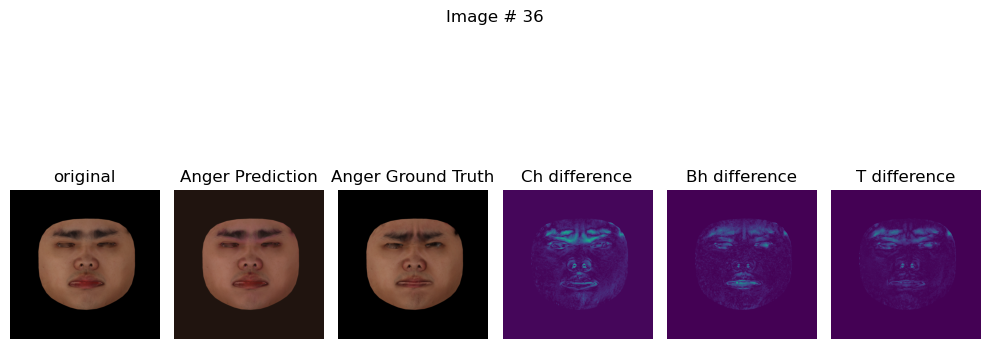

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/37neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/37anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/37smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.006369123235344887ch 0.004006984643638134cm 0.002319758292287588cm 0.0031654464546591043 cm 0.0016706794267520308


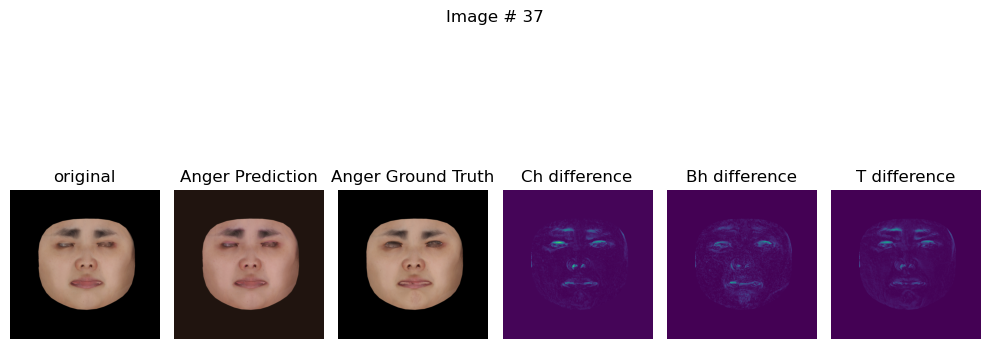

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/38neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/38anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/38smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.0072934855706989765ch 0.003776607569307089cm 0.002319758292287588cm 0.0035703631583601236 cm 0.0012379990657791495


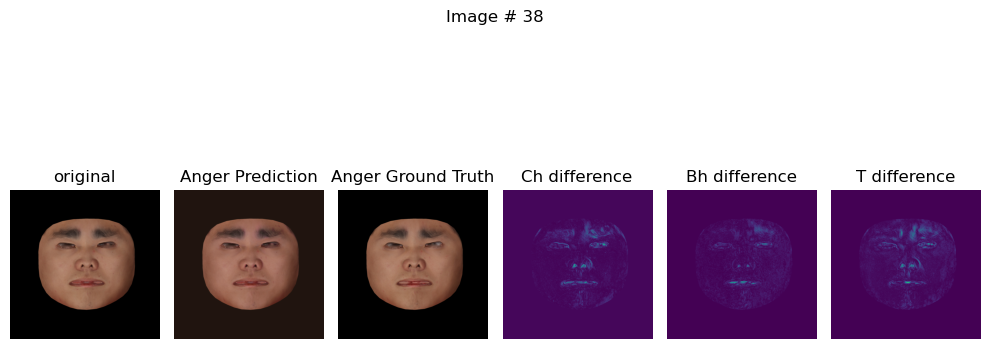

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/39neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/39anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/39smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.0059887561947107315ch 0.003979134373366833cm 0.002319758292287588cm 0.0030734592583030462 cm 0.0016548738349229097


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


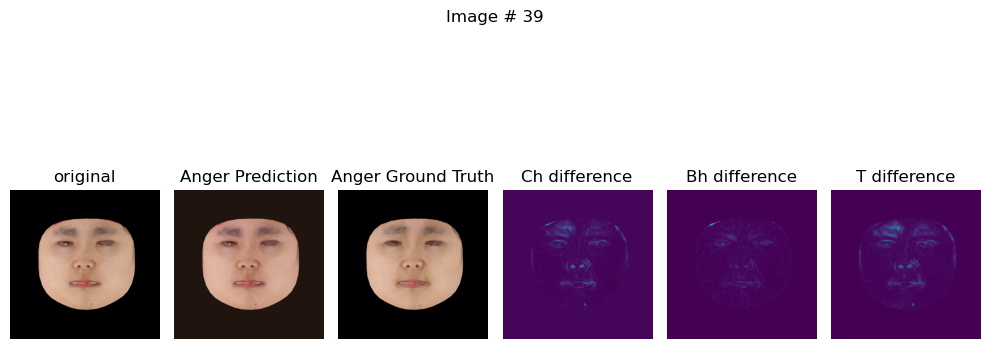

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/40neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/40anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/40smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008083461783826351ch 0.005312036722898483cm 0.002319758292287588cm 0.003753285389393568 cm 0.0023380944039672613


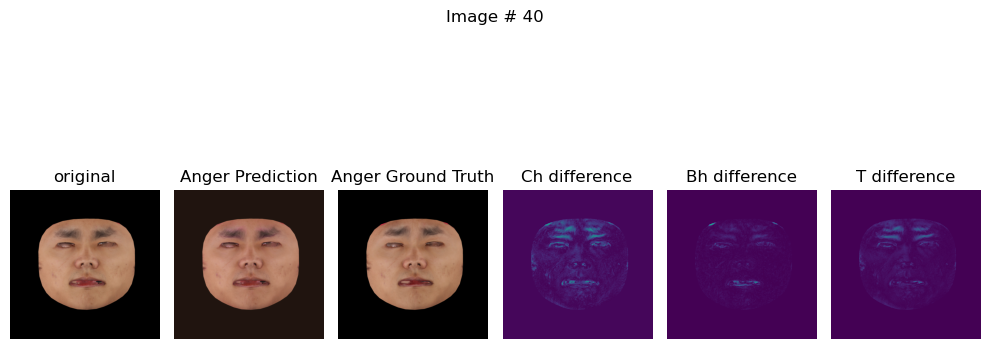

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/41neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/41anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/41smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008568991906940937ch 0.0044540176168084145cm 0.002319758292287588cm 0.004040869884192944 cm 0.0016340089496225119


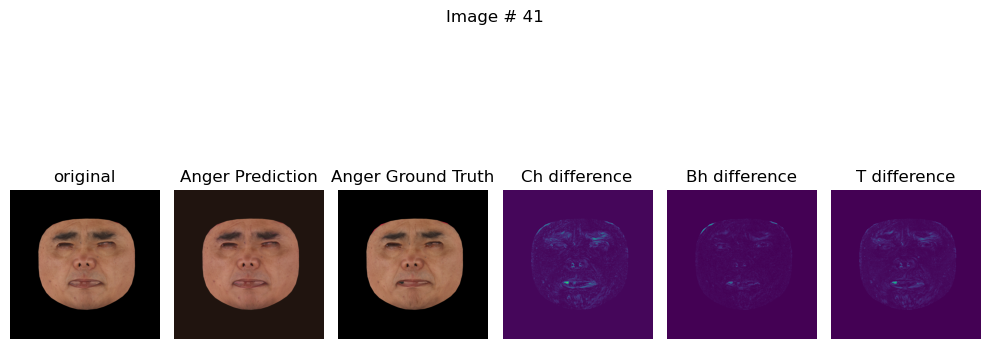

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/42neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/42anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/42smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.01176967192441225ch 0.006504068151116371cm 0.002319758292287588cm 0.007515077944844961 cm 0.002953100483864546


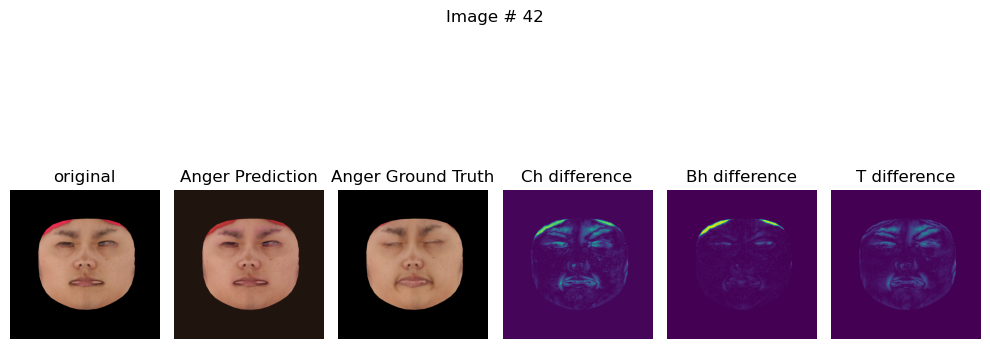

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/43neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/43anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/43smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007743172347545624ch 0.004532467573881149cm 0.002319758292287588cm 0.00392449414357543 cm 0.002158224815502763


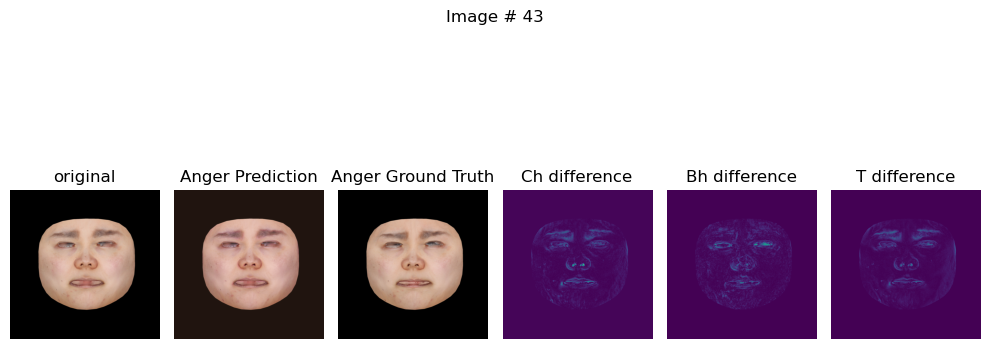

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/44neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/44anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/44smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009951559826731682ch 0.005387258715927601cm 0.002319758292287588cm 0.004950597416609526 cm 0.0021326735150069


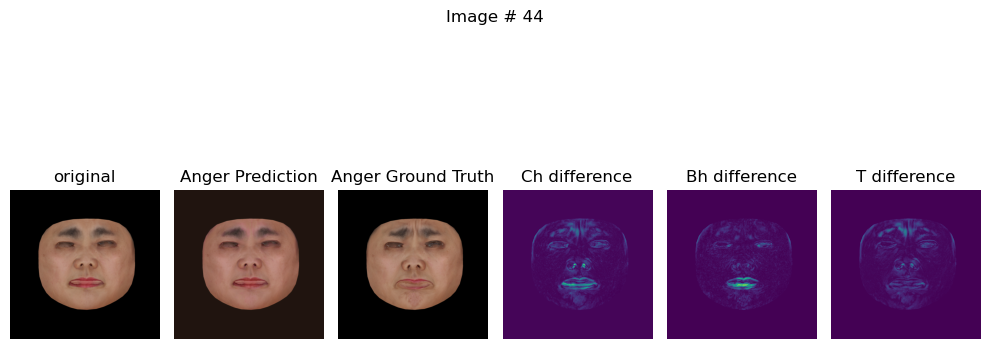

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/45neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/45anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/45smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.00635146489366889ch 0.0038820512127131224cm 0.002319758292287588cm 0.0031812433153390884 cm 0.0011623468017205596


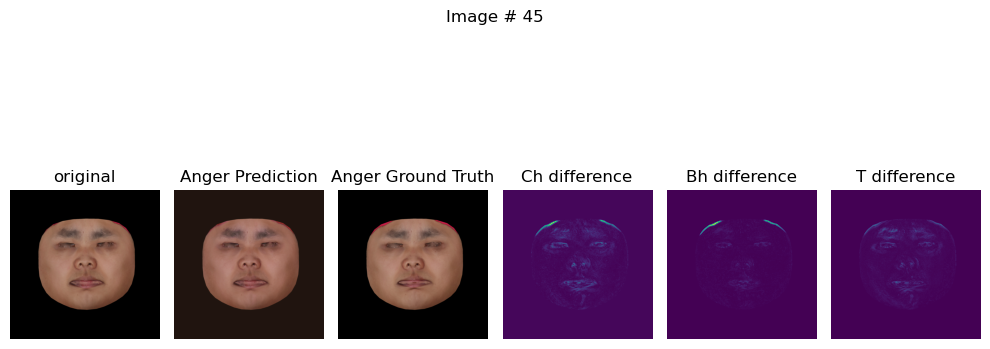

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/46neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/46anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/46smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.006859832443296909ch 0.004022234119474888cm 0.002319758292287588cm 0.0028136041946709156 cm 0.0011406028643250465


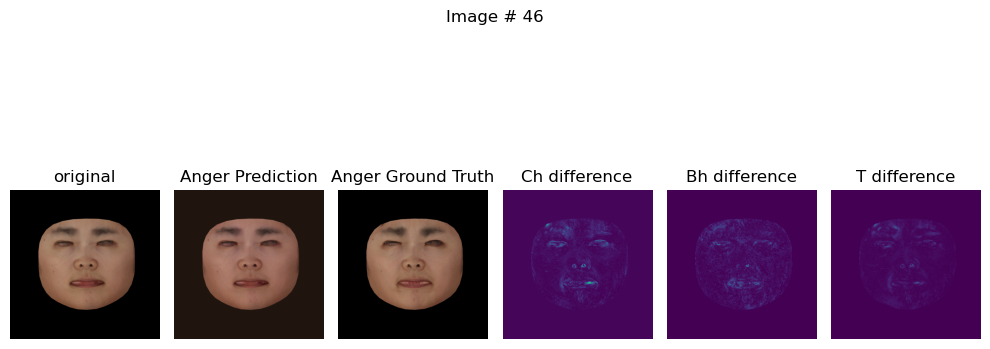

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/47neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/47anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/47smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.0068293362855911255ch 0.00390795199200511cm 0.002319758292287588cm 0.0027446069288998842 cm 0.0012318820226937532


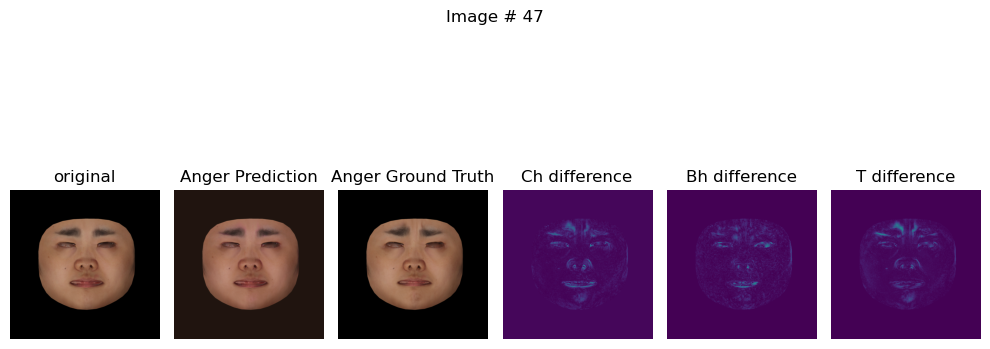

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/48neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/48anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/48smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008225987665355206ch 0.004623398184776306cm 0.002319758292287588cm 0.003512839088216424 cm 0.0018002495635300875


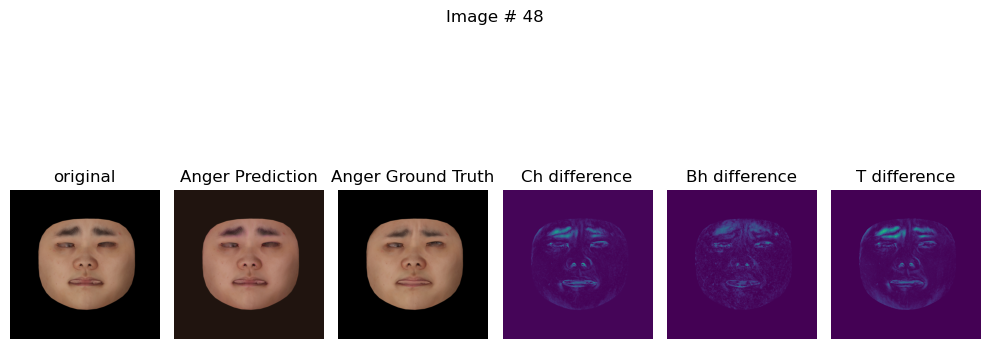

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/49neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/49anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/49smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008714945986866951ch 0.0049320003017783165cm 0.002319758292287588cm 0.0047556934878230095 cm 0.0020895253401249647


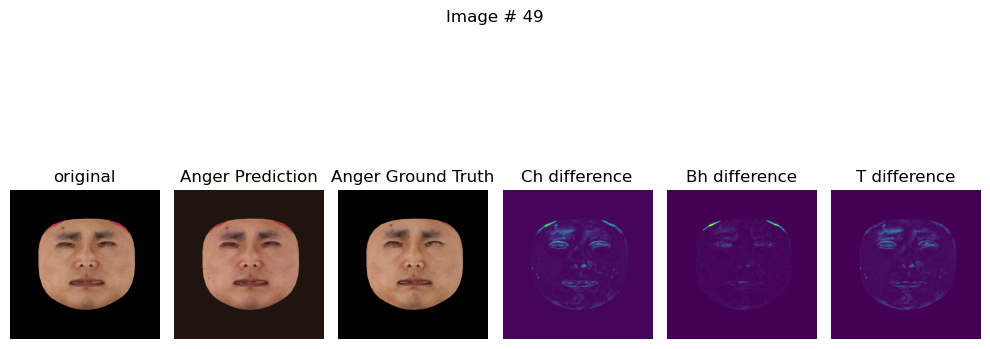

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/50neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/50anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/50smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008097660727798939ch 0.005304261110723019cm 0.002319758292287588cm 0.0034677195362746716 cm 0.002476510824635625


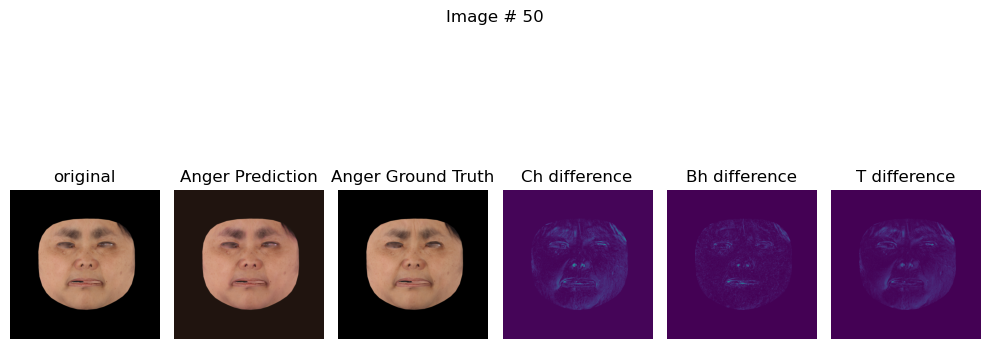

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/51neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/51anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/51smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011951523832976818ch 0.00570211187005043cm 0.002319758292287588cm 0.005376292392611504 cm 0.0027227902319282293


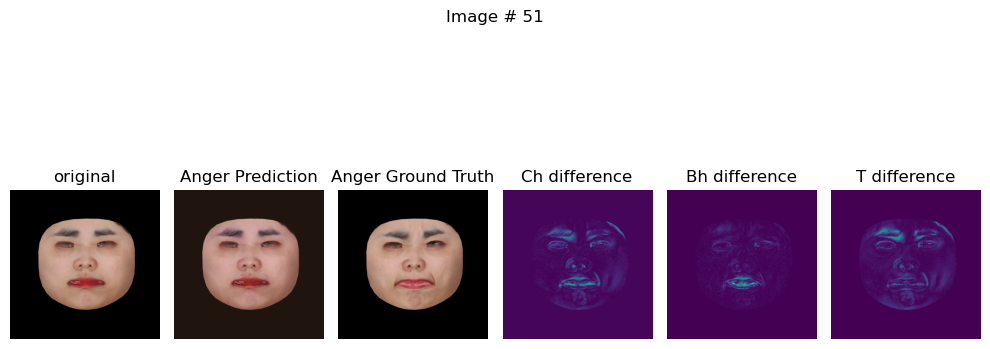

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/52neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/52anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/52smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009182428009808064ch 0.004130922257900238cm 0.002319758292287588cm 0.0028659109957516193 cm 0.0011514632496982813


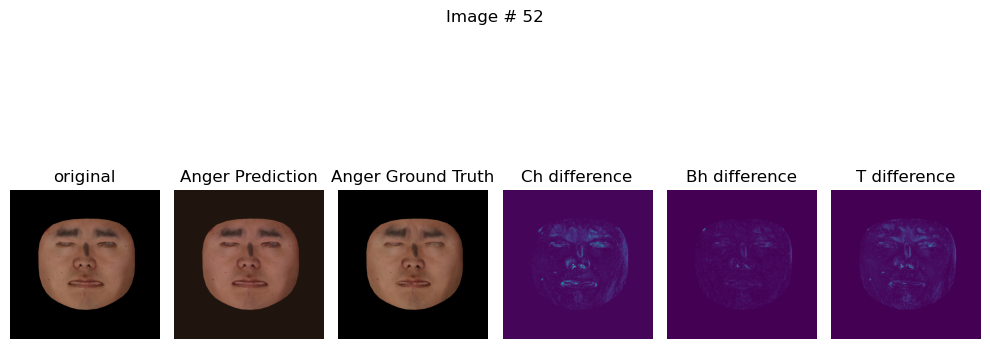

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/53neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/53anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/53smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009388026781380177ch 0.0044575035572052cm 0.002319758292287588cm 0.0035521930549293756 cm 0.0013604221167042851


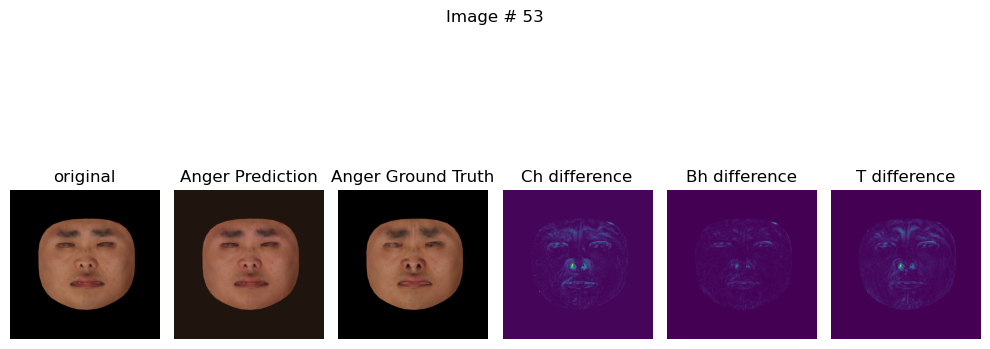

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/54neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/54anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/54smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008411329239606857ch 0.004726278595626354cm 0.002319758292287588cm 0.003985388670116663 cm 0.002013328718021512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


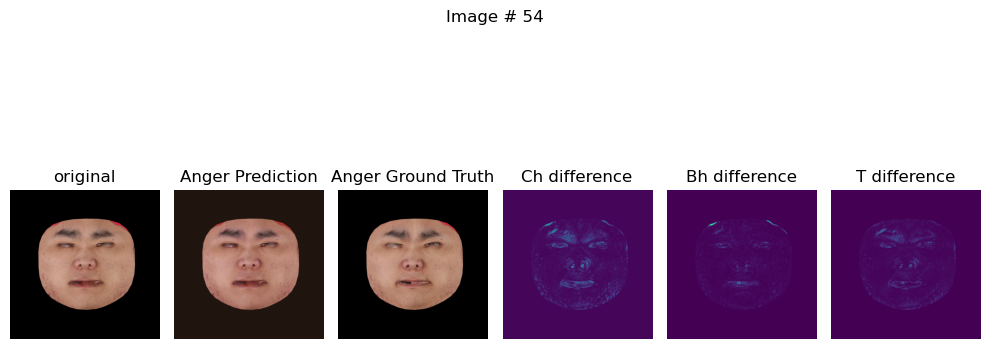

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/55neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/55anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/55smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008567648008465767ch 0.004739268682897091cm 0.002319758292287588cm 0.00448204018175602 cm 0.0017886994173750281


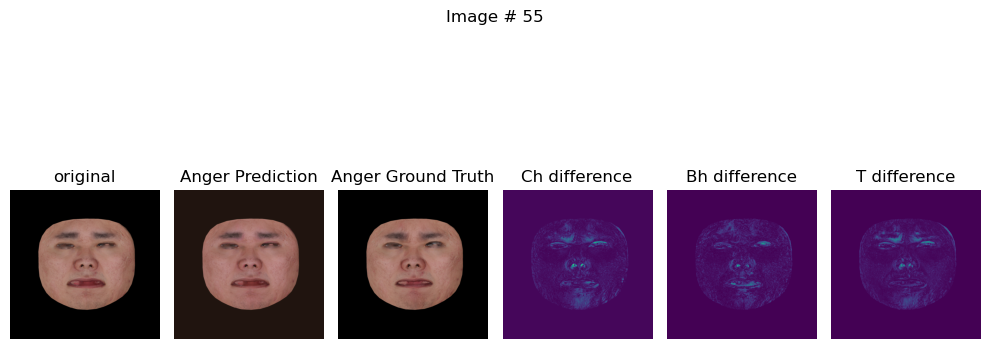

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/56neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/56anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/56smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009101972915232182ch 0.0048914458602666855cm 0.002319758292287588cm 0.004137859679758549 cm 0.0019428469240665436


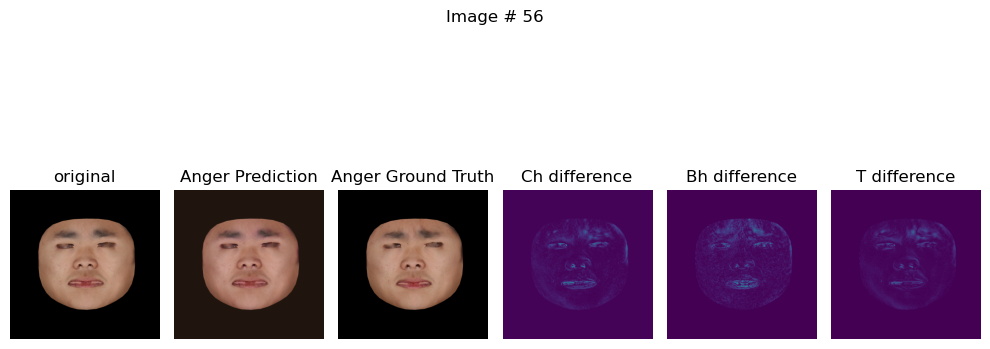

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/57neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/57anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/57smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008986853994429111ch 0.005162556655704975cm 0.002319758292287588cm 0.004192437045276165 cm 0.0027546759229153395


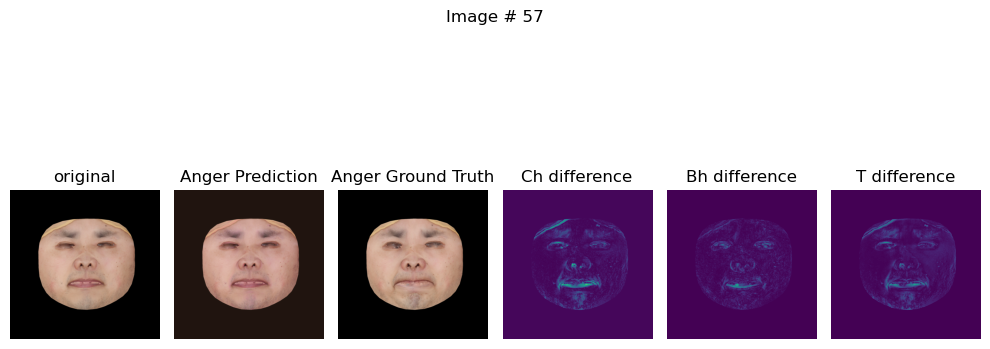

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/58neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/58anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/58smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010985960252583027ch 0.005915091373026371cm 0.002319758292287588cm 0.004602550994604826 cm 0.002795875072479248


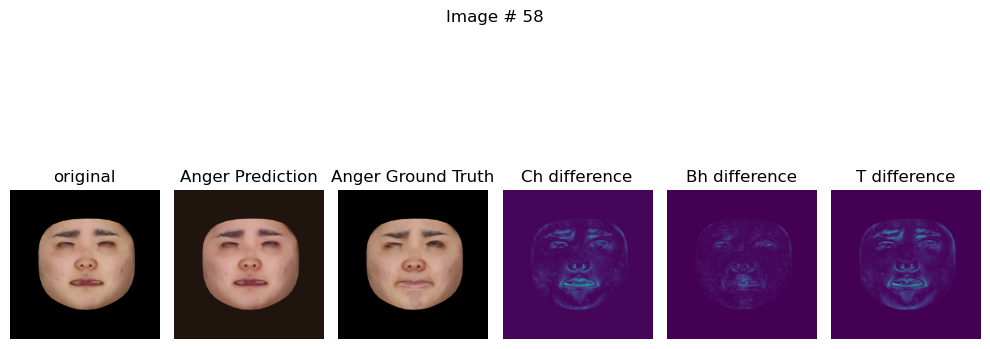

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/59neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/59anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/59smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011394154280424118ch 0.005508864298462868cm 0.002319758292287588cm 0.0048093670047819614 cm 0.0024069268256425858


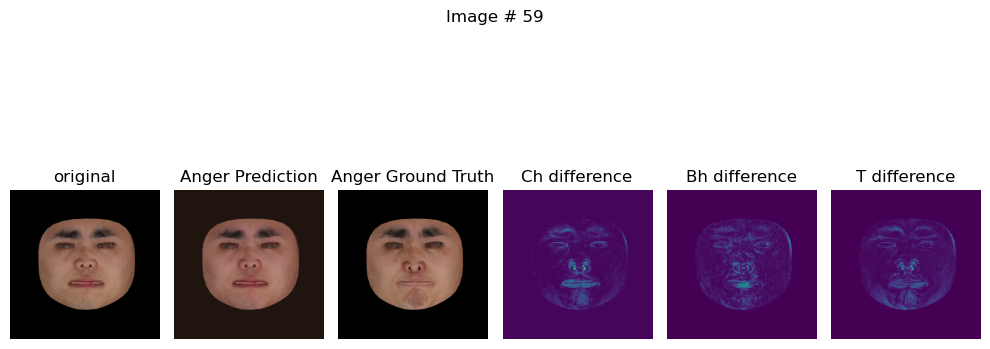

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/60neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/60anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/60smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.01026905607432127ch 0.005336827598512173cm 0.002319758292287588cm 0.004719837568700314 cm 0.002095828764140606


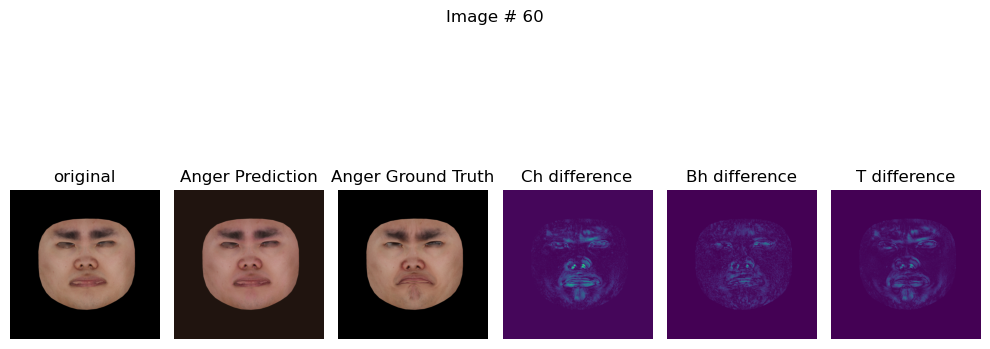

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/61neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/61anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/61smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011995013803243637ch 0.0061121173202991486cm 0.002319758292287588cm 0.004650668241083622 cm 0.0029024211689829826


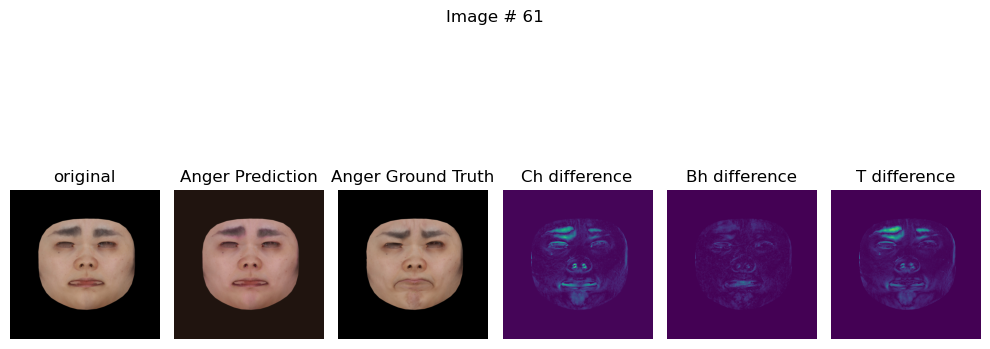

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/62neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/62anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/62smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009360434487462044ch 0.005324407480657101cm 0.002319758292287588cm 0.004074438940733671 cm 0.002350572030991316


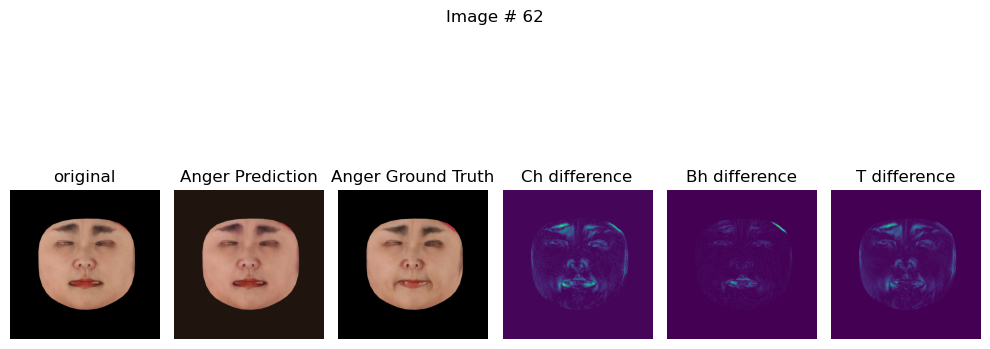

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/63neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/63anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/63smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008565356954932213ch 0.004544628784060478cm 0.002319758292287588cm 0.004264061339199543 cm 0.002045195084065199


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


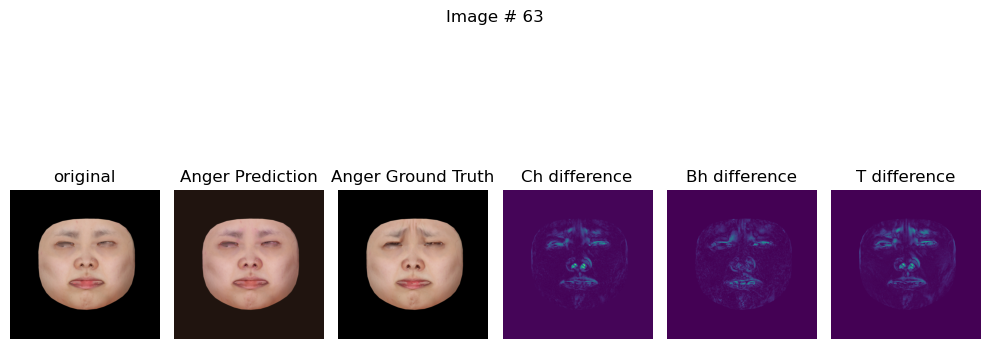

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/64neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/64anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/64smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.01104582380503416ch 0.00518999807536602cm 0.002319758292287588cm 0.004188539460301399 cm 0.0016214229399338365


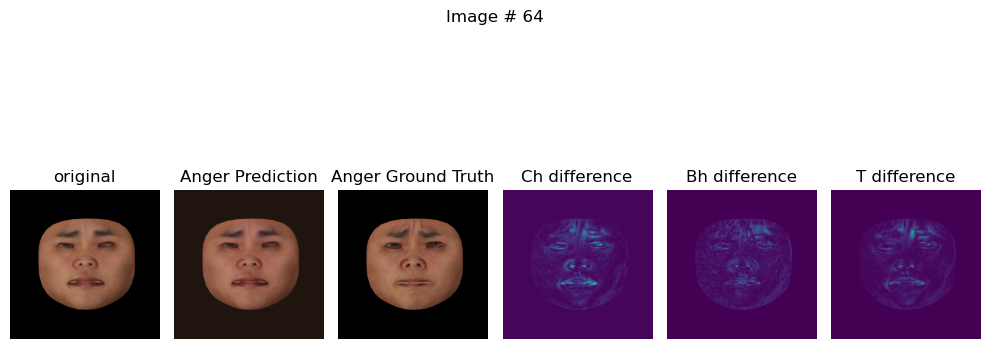

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/65neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/65anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/65smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.014466684311628342ch 0.005684772506356239cm 0.002319758292287588cm 0.0053031607531011105 cm 0.0016784624895080924


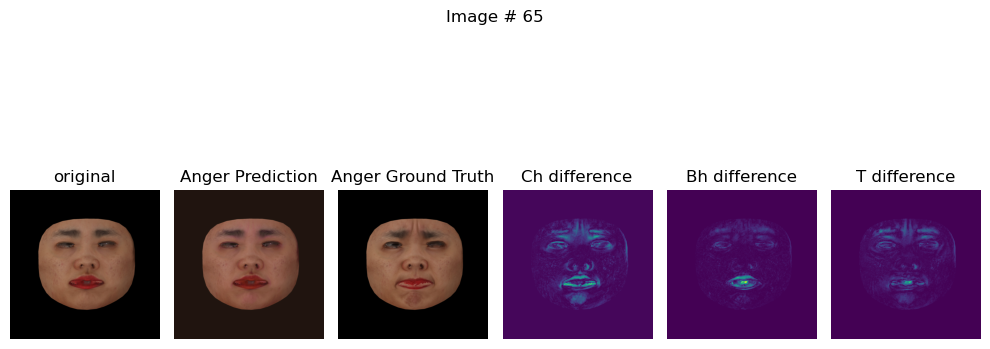

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/66neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/66anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/66smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.012223592028021812ch 0.005664019845426083cm 0.002319758292287588cm 0.004949517082422972 cm 0.002601916901767254


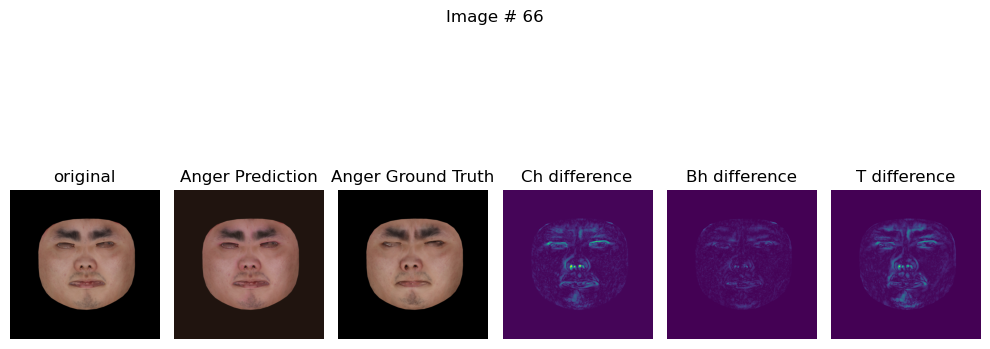

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/67neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/67anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/67smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008024717681109905ch 0.004922307096421719cm 0.002319758292287588cm 0.004431442357599735 cm 0.0019783785101026297


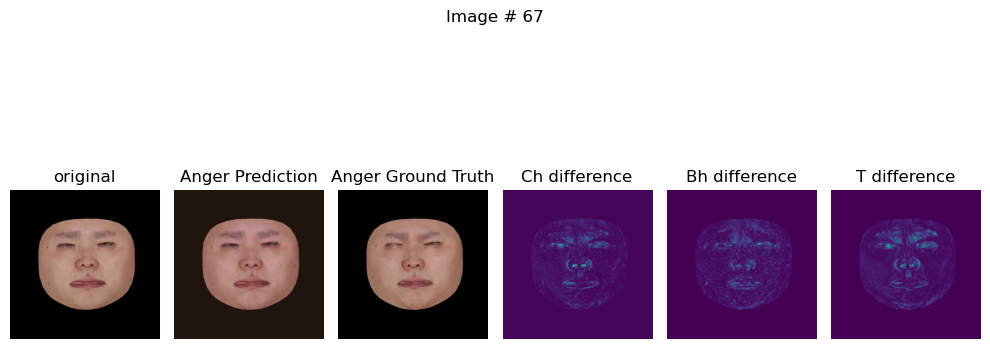

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/68neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/68anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/68smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.025808796286582947ch 0.019372867420315742cm 0.002319758292287588cm 0.056893642991781235 cm 0.018206506967544556


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


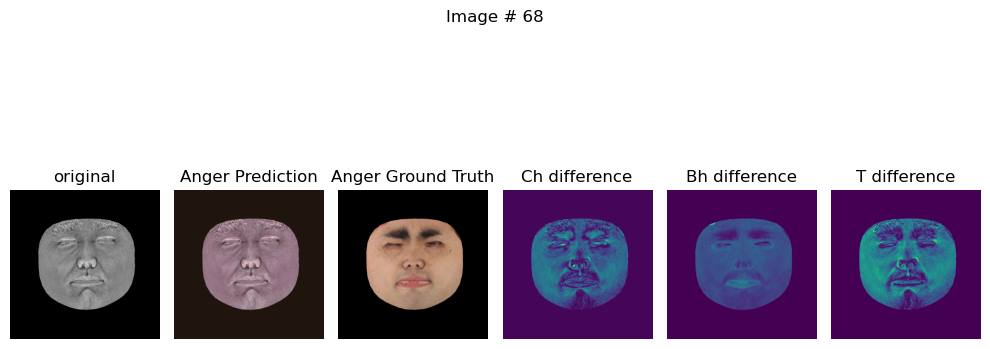

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/69neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/69anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/69smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.012449891306459904ch 0.006334616802632809cm 0.002319758292287588cm 0.005268682260066271 cm 0.002890016185119748


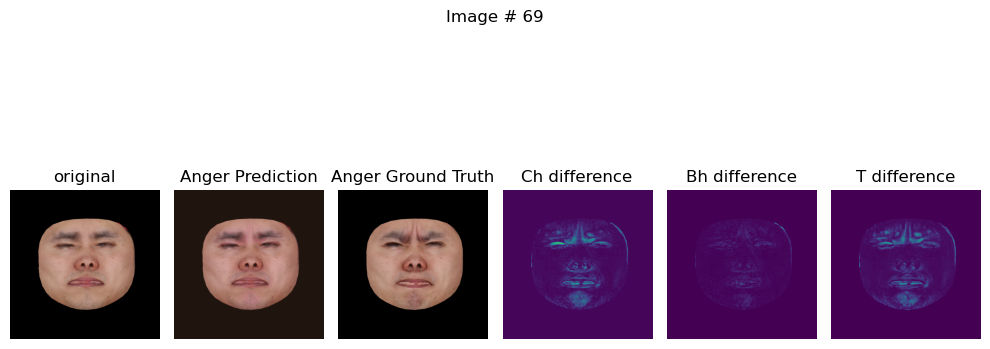

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/70neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/70anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/70smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008122626692056656ch 0.004516304470598698cm 0.002319758292287588cm 0.00446689035743475 cm 0.0017167009646072984


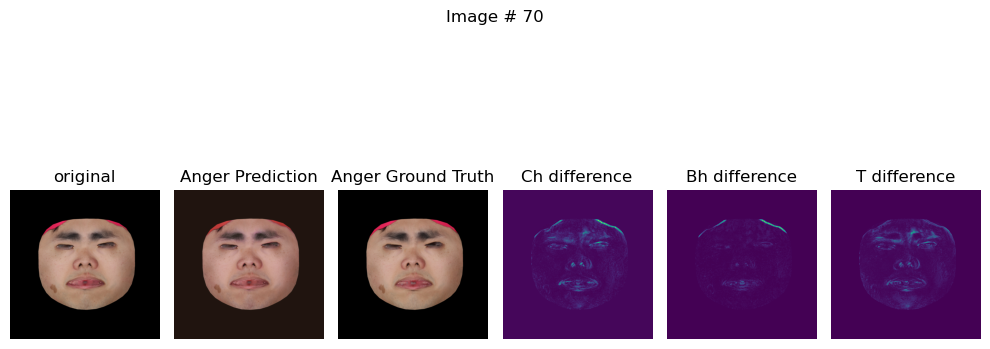

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/71neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/71anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/71smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008054396137595177ch 0.005094842053949833cm 0.002319758292287588cm 0.005141443107277155 cm 0.0020074243657290936


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


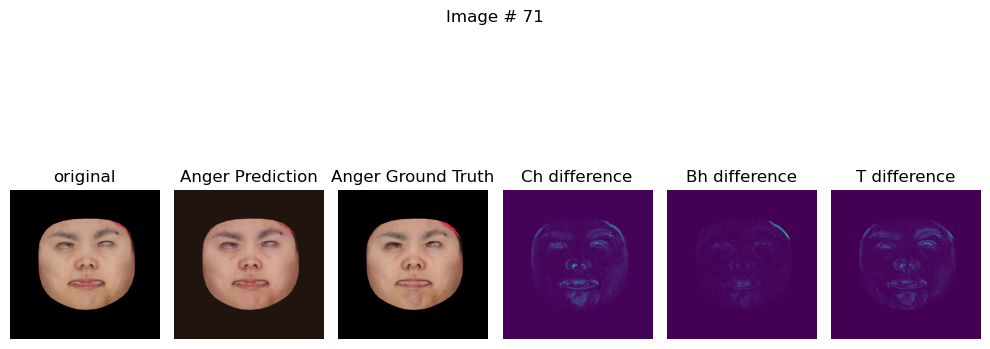

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/72neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/72anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/72smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.012788794003427029ch 0.006252664141356945cm 0.002319758292287588cm 0.005246104206889868 cm 0.0032406009268015623


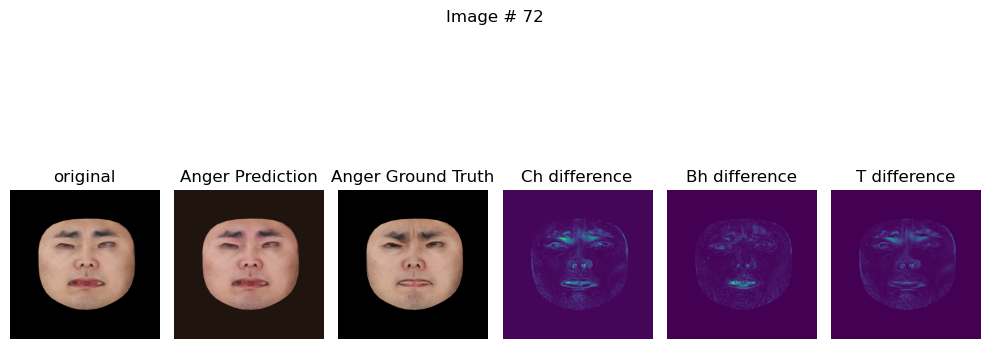

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/73neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/73anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/73smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011291399598121643ch 0.005816735327243805cm 0.002319758292287588cm 0.0048359972424805164 cm 0.002771293744444847


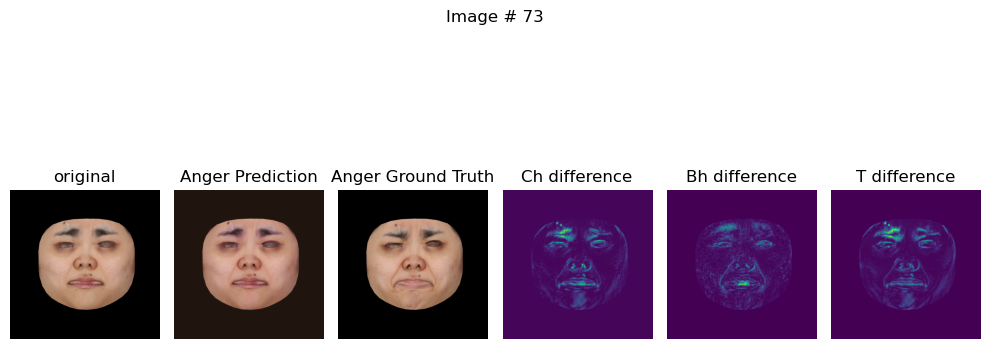

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/74neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/74anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/74smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009739291854202747ch 0.004291140474379063cm 0.002319758292287588cm 0.0034778863191604614 cm 0.0010718251578509808


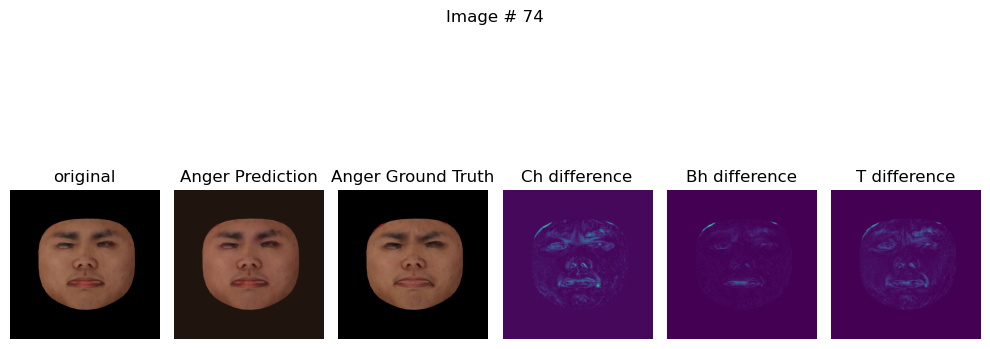

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/75neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/75anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/75smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.011243743821978569ch 0.005745992995798588cm 0.002319758292287588cm 0.005890464410185814 cm 0.002622497733682394


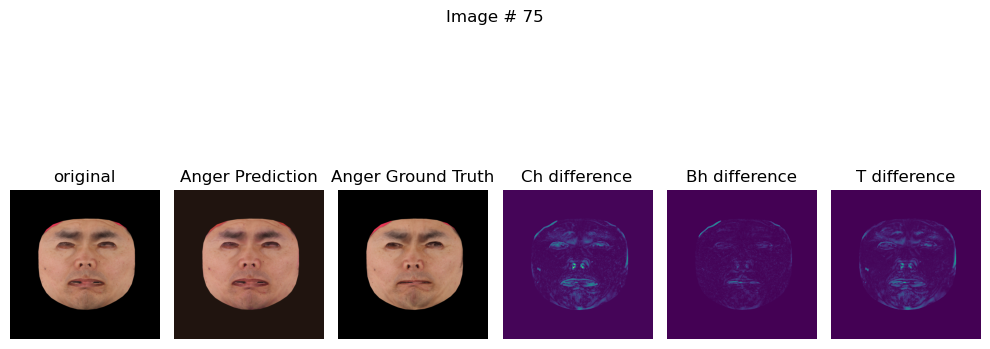

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/76neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/76anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/76smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009905638173222542ch 0.00487492885440588cm 0.002319758292287588cm 0.004598535131663084 cm 0.002095941687002778


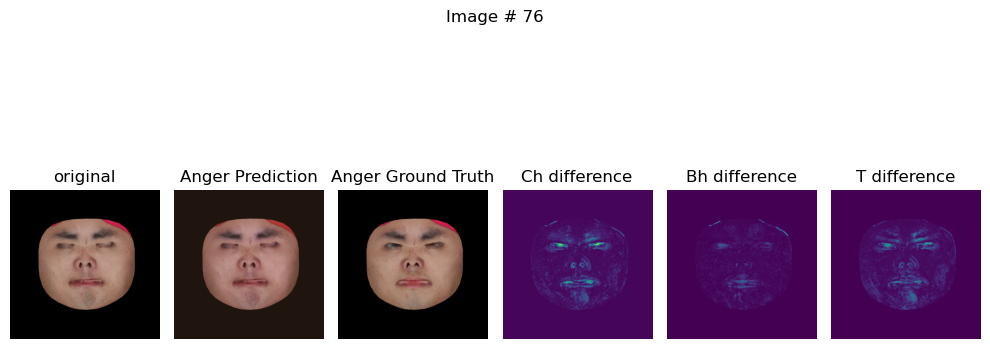

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/77neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/77anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/77smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007111482322216034ch 0.00405458640307188cm 0.002319758292287588cm 0.003457034006714821 cm 0.0016507530817762017


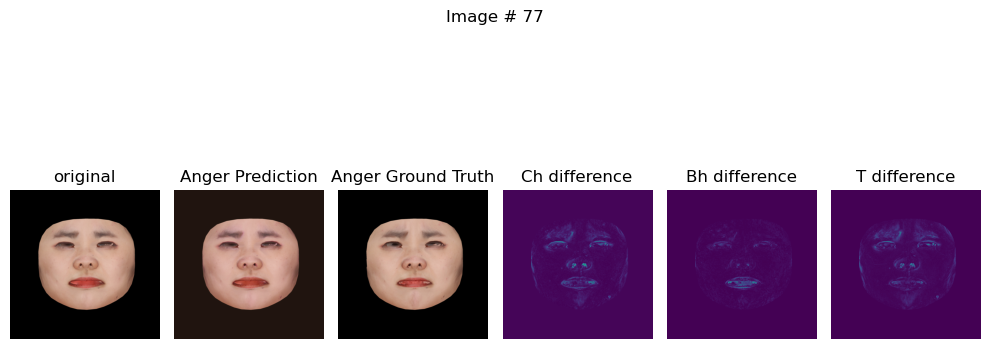

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/78neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/78anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/78smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.007120107766240835ch 0.004263239912688732cm 0.002319758292287588cm 0.004100455902516842 cm 0.0017906588036566973


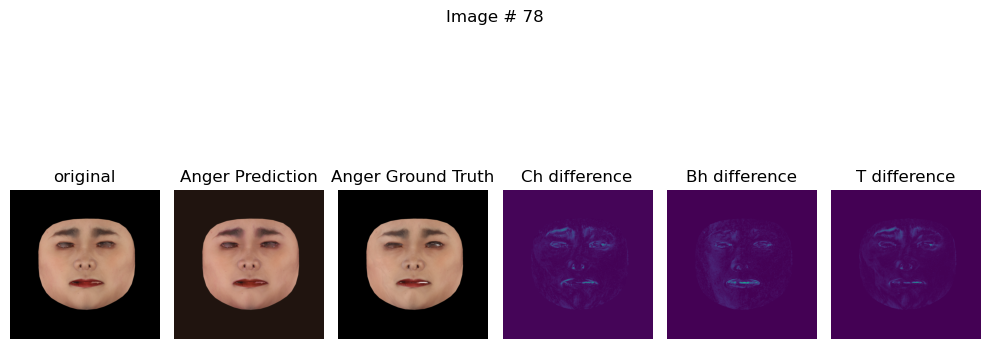

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/79neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/79anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/79smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008821705356240273ch 0.0047004567459225655cm 0.002319758292287588cm 0.0035056897904723883 cm 0.0015190093545243144


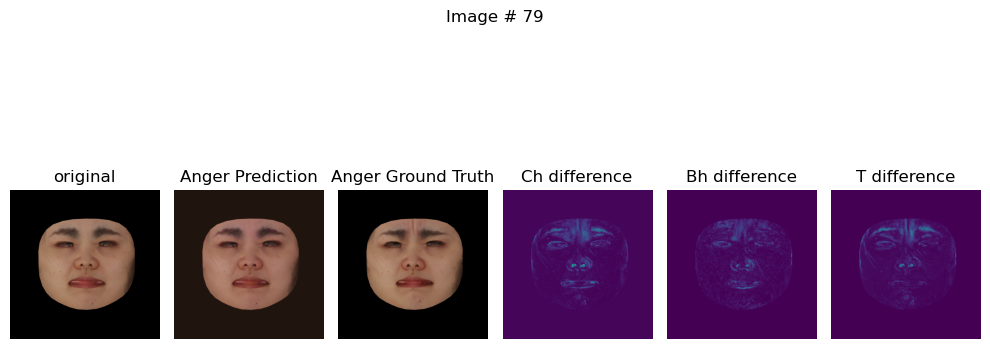

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/80neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/80anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/80smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.0070333597250282764ch 0.00400018785148859cm 0.002319758292287588cm 0.002707536332309246 cm 0.0011752450373023748


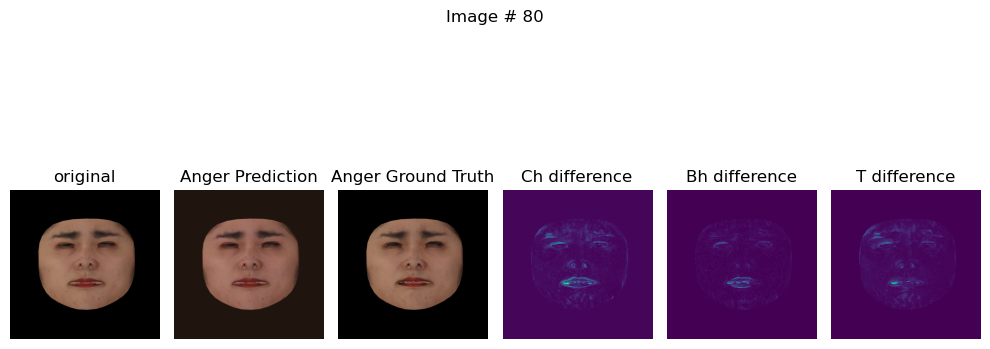

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/81neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/81anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/81smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010161337442696095ch 0.004572479985654354cm 0.002319758292287588cm 0.0031815548427402973 cm 0.0013886844972148538


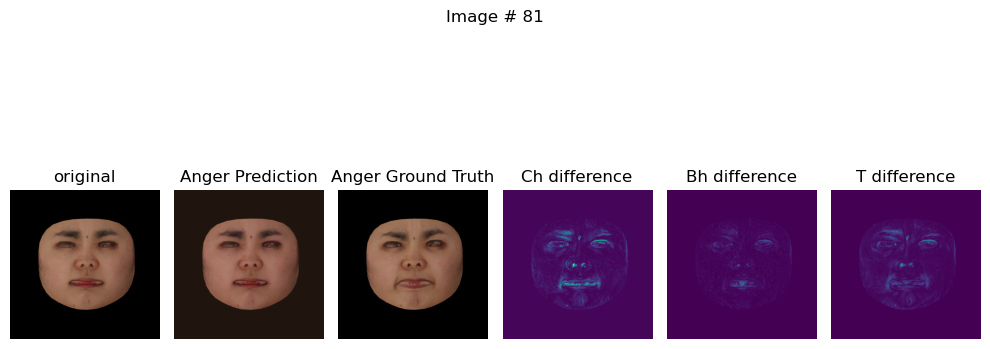

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/82neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/82anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/82smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009114242158830166ch 0.004129982553422451cm 0.002319758292287588cm 0.003467002883553505 cm 0.0009564729989506304


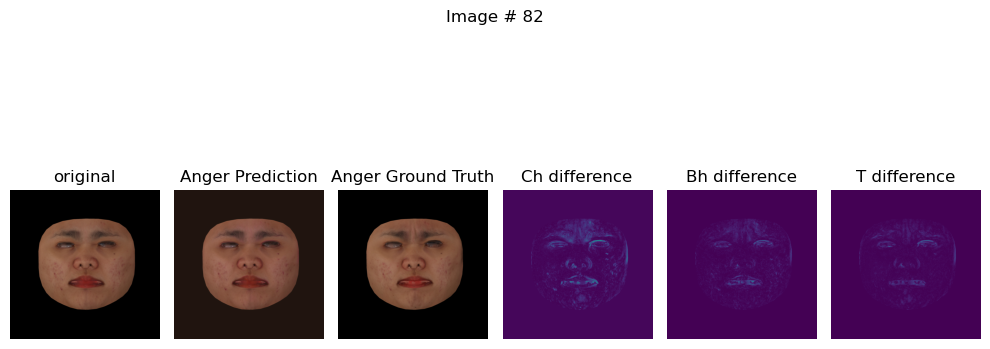

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/83neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/83anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/83smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.012730907648801804ch 0.007154572755098343cm 0.002319758292287588cm 0.004481289070099592 cm 0.0036998025607317686


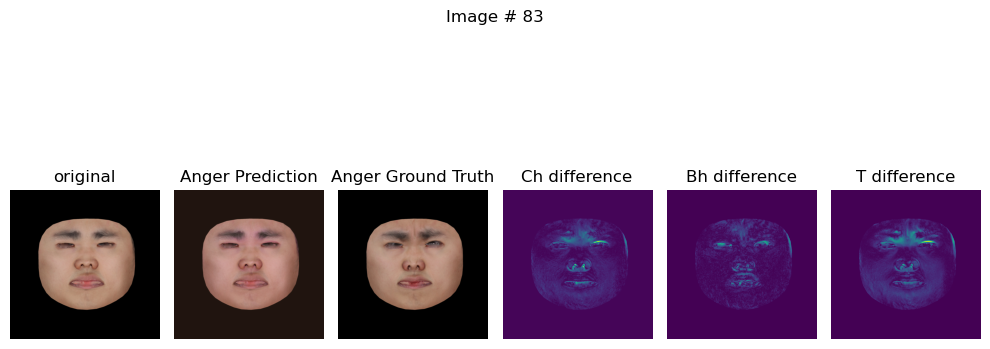

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/84neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/84anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/84smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008137527853250504ch 0.004717385396361351cm 0.002319758292287588cm 0.005177272949367762 cm 0.001967228250578046


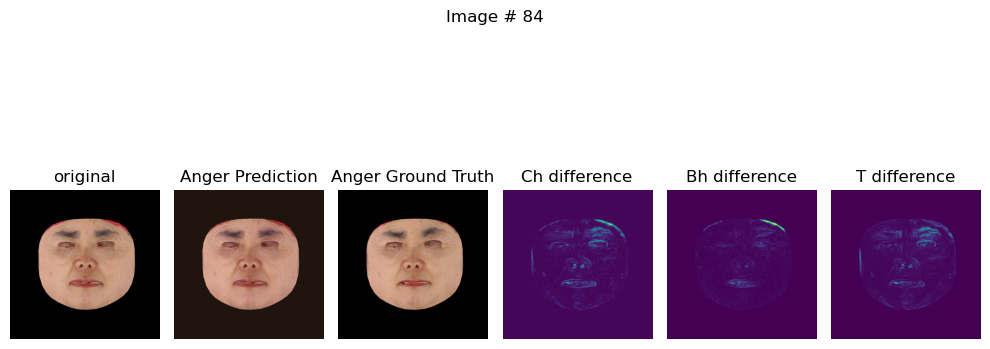

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/85neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/85anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/85smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.008523314259946346ch 0.004896326921880245cm 0.002319758292287588cm 0.0031717780511826277 cm 0.0014449992449954152


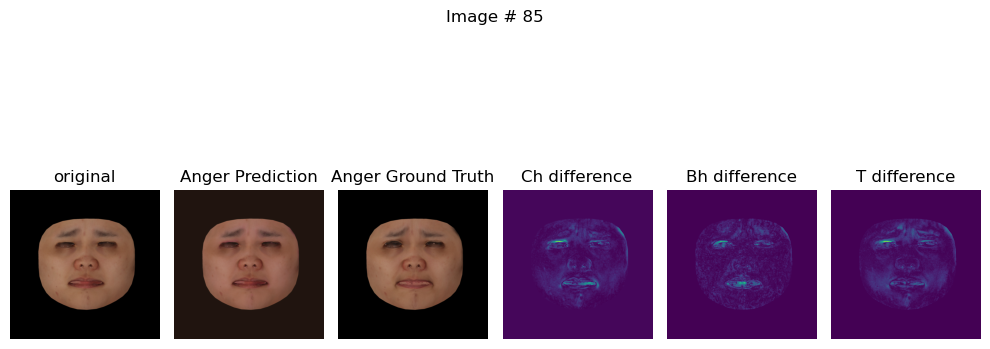

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/86neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/86anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/86smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.009205834940075874ch 0.004230014979839325cm 0.002319758292287588cm 0.003407313022762537 cm 0.0009674797183834016


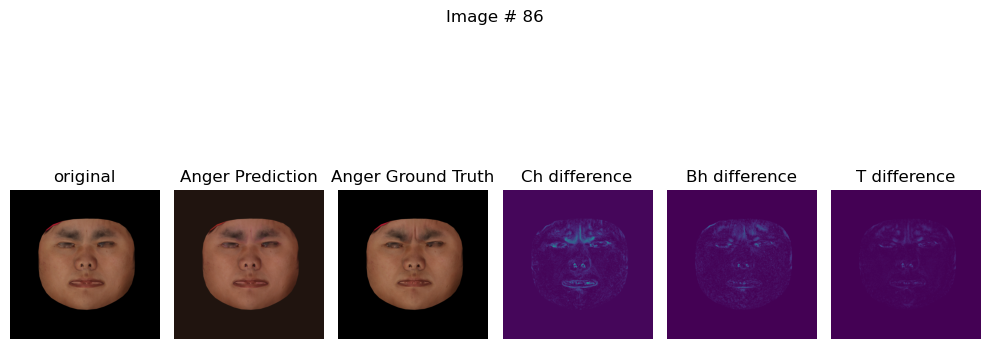

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/87neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/87anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/87smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010544788092374802ch 0.0049708206206560135cm 0.002319758292287588cm 0.0036327862180769444 cm 0.0018635131418704987


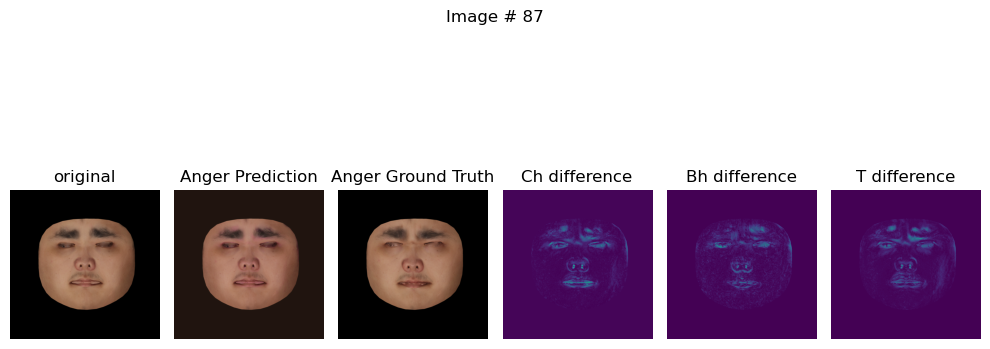

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/88neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/88anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/88smile.png
(2048, 2048, 3)
pred_maps_a[:1] 0.11884628981351852 0.6048188209533691
pred_maps_n[:3] 0.11884628981351852 0.6048188209533691
cm 0.010821584612131119ch 0.006709501147270203cm 0.002319758292287588cm 0.005735151004046202 cm 0.0033581398893147707


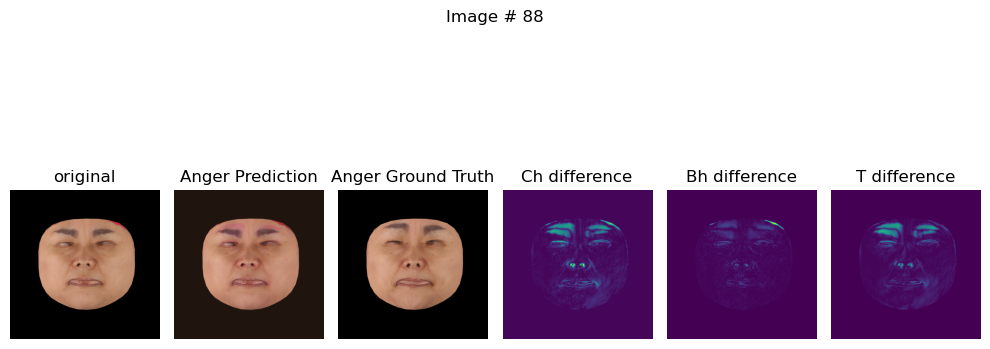

x /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral/89neutral.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger/89anger.png
y /Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile/89smile.png
(2048, 2048, 3)


In [250]:
anger_directory = r"/Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_anger"
neutral_directory = r"/Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_neutral"
smile_directory = r"/Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/emotions/warped_smile"

anger_files_full = os.listdir(anger_directory)
neutral_files_full = os.listdir(neutral_directory)
smile_files_full = os.listdir(smile_directory)

def extract_number_from_filename(filename):
    return int(''.join([c for c in filename if c.isdigit()]))

# Filter out files that don't end with ".png"
anger_files_full = [f for f in anger_files_full if f.endswith(".png")]
neutral_files_full = [f for f in neutral_files_full if f.endswith(".png")]
smile_files_full = [f for f in smile_files_full if f.endswith(".png")]
# Sort files based on extracted numbers
sorted_anger_files = sorted(anger_files_full, key=extract_number_from_filename)
sorted_neutral_files = sorted(neutral_files_full, key=extract_number_from_filename)
sorted_smile_files = sorted(smile_files_full, key=extract_number_from_filename)
# print("Sorted Anger Files:", sorted_anger_files)
# print("Sorted Neutral Files:", sorted_neutral_files)

#load images into arrays
train_x = []
train_y = []
test_x = []
test_y = []
WIDTH = HEIGHT = 2048
sum_dif_ch = None
sum_dif_bh = None
idx = 0
for x,y,z in zip(sorted_neutral_files, sorted_anger_files, sorted_smile_files):
    
    x = os.path.join(neutral_directory,x)
    y = os.path.join(anger_directory, y)
    z = os.path.join(smile_directory, z)
    print(f"x {x}")
    print(f"y {y}")
    print(f"y {z}")
    # Load image
    # img_anger = cv2.imread(anger_path, cv2.IMREAD_COLOR)
    x = cv2.imread(x, cv2.IMREAD_COLOR)
    y = cv2.imread(y, cv2.IMREAD_COLOR)
    z = cv2.imread(z, cv2.IMREAD_COLOR)
    # Convert image to RGB
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    y = cv2.cvtColor(y, cv2.COLOR_BGR2RGB)
    z = cv2.cvtColor(z, cv2.COLOR_BGR2RGB)

    # Resize imagex
    # img_anger = cv2.resize(img_anger, (WIDTH, HEIGHT))
    x = cv2.resize(x, (WIDTH, HEIGHT))
    y = cv2.resize(y, (WIDTH, HEIGHT))
    z = cv2.resize(z, (WIDTH, HEIGHT))

    x = np.asarray(x)/255.0
    y = np.asarray(y)/255.0
    z = np.asarray(z)/255.0

    print(y.shape)
    # x[:,:,0] *= float(0.98)
    # y[:,:,0] *= float(1.001)
    # y[:,:,1] *= float(0.999)
    # y[:,:,2] *= float(0.999)


    pred_maps_a, ta = encode(y)
    pred_maps_n, tn = encode(x)
    pred_maps_s, ts = encode(z)

    recovered_n, rtn = decode(pred_maps_n)
    recovered_a, rta = decode(pred_maps_a)
    recovered_s, rts = decode(pred_maps_s)
    # plt.imshow(recovered_n.reshape(WIDTH,HEIGHT,3))
    # plt.title("n recovered")
    # plt.show()
    # plt.imshow(recovered_a.reshape(WIDTH,HEIGHT,3))
    # plt.title("a recovered")

    # plt.show()

    
    # pred_maps_n
    # plt.imshow(pred_maps_a[:,1].reshape(WIDTH, HEIGHT), cmap = "viridis")
    # plt.title("Ch anger")
    # plt.show()
    print(f"pred_maps_a[:1] {np.min(pred_maps_a[:1])} {np.max(pred_maps_a[:1])}")
    print(f"pred_maps_n[:3] {np.min(pred_maps_n[:3])} {np.max(pred_maps_n[:3])}")
    cm_dif = np.abs(pred_maps_a[:,0] - pred_maps_n[:,0]).reshape(WIDTH, HEIGHT)
    ch_dif = np.abs(pred_maps_a[:,1]*1.01 - pred_maps_n[:,1]).reshape(WIDTH, HEIGHT)
    # ch_dif += ((np.abs(pred_maps_s[:,1] - pred_maps_n[:,1]))).reshape(WIDTH, HEIGHT)
    # ch_dif += ((np.abs(pred_maps_s[:,1] - pred_maps_a[:,1]))).reshape(WIDTH, HEIGHT)
    # bm_dif = np.abs(pred_maps_a[:,2] - pred_maps_n[:,2]).reshape(WIDTH, HEIGHT)
    # bh_dif = np.abs(pred_maps_a[:,3]*1.01 - pred_maps_n[:,3]).reshape(WIDTH, HEIGHT)
    # bh_dif += ((np.abs(pred_maps_s[:,3] - pred_maps_n[:,3]))).reshape(WIDTH, HEIGHT)
    # bh_dif += ((np.abs(pred_maps_s[:,3] - pred_maps_a[:,3]))).reshape(WIDTH, HEIGHT)
    bh_dif = np.abs(pred_maps_a[:,3] - pred_maps_n[:,3]).reshape(WIDTH, HEIGHT)

    t_dif = np.abs(pred_maps_a[:,4] - pred_maps_n[:,4]).reshape(WIDTH, HEIGHT)
    print(f"cm {np.mean(cm_dif)}ch {np.mean(ch_dif)}cm {np.mean(bm_dif)}cm {np.mean(bh_dif)} cm {np.mean(t_dif)}")
    # cm_dif.reshape(WIDTH, HEIGHT)
    # ch_dif.reshape(WIDTH, HEIGHT)
    # bm_dif.reshape(WIDTH, HEIGHT)
    # bh_dif.reshape(WIDTH, HEIGHT)
    # t_dif.reshape(WIDTH, HEIGHT)
    if idx == 0:
        # sum_dif_ch = np.empty_like(ch_dif)
        # sum_dif_bh = np.empty_like(bh_dif)
        sum_dif_ch = ch_dif
        sum_dif_bh = bh_dif
        sum_dif_t = t_dif
    else:
        sum_dif_ch += np.abs(sum_dif_ch + ch_dif)
        sum_dif_bh += np.abs(sum_dif_bh + bh_dif)
        sum_dif_t += np.abs(sum_dif_t + t_dif)

    idx += 1
    # plt.imshow(cm_dif, cmap="viridis")
    # plt.title("Cm difference")
    # plt.show()
    fig, ax = plt.subplots(1, 6, figsize=(10, 5))
    fig.suptitle(f"Image # {idx}")
    ax[3].imshow(ch_dif, cmap="viridis")
    ax[3].axis('off')
    ax[3].set_title("Ch difference")
    
    # plt.imshow(bm_dif, cmap="viridis")
    # plt.title("Bm difference")
    # plt.show()
    ax[4].imshow(bh_dif, cmap="viridis")
    ax[4].axis('off')
    ax[4].set_title("Bh difference")
    
    ax[5].imshow(t_dif, cmap="viridis")
    ax[5].axis('off')
    ax[5].set_title("T difference")
    

    train_x.append(x)
    train_y.append(y)

    pred_maps_n[:,1] = pred_maps_n[:,1] + ch_dif.reshape(-1,)
    # pred_maps_n[:,3] = pred_maps_n[:,3] + bh_dif.reshape(-1,)
    # pred_maps_n[:,4] = pred_maps_n[:,4] + t_dif.reshape(-1,)
    pred_maps_n[:,3] = pred_maps_n[:,3] + + ch_dif.reshape(-1,)
    # pred_maps_n[:,4] = pred_maps_n[:,4]
    anger, t = decode(pred_maps_n)
    # fig,ax = plt.subplots(1,2)
    ax[0].imshow(x)
    ax[0].axis('off')
    ax[0].set_title("original")

    ax[1].imshow(anger.reshape(WIDTH,HEIGHT,3))
    ax[1].axis('off')
    ax[1].set_title("Anger Prediction")

    ax[2].imshow(y)
    ax[2].axis('off')
    ax[2].set_title("Anger Ground Truth")
    plt.tight_layout()
    plt.show()
WIDTH = HEIGHT = x.shape[0]
plt.imshow(sum_dif_ch/idx, cmap='viridis')
plt.title("Mean Dif = Sum(Ch_Anger - Ch_Neutral)/n ")
plt.show()



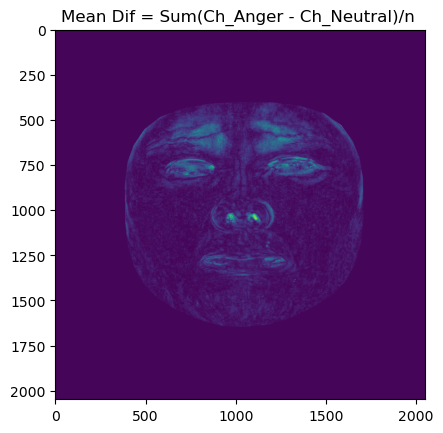

In [ ]:
plt.imshow(sum_dif_ch, cmap='viridis')
plt.title("Mean Dif = Sum(Ch_Anger - Ch_Neutral)/n ")
plt.show()

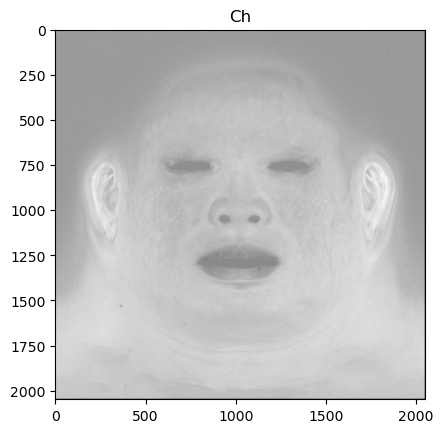

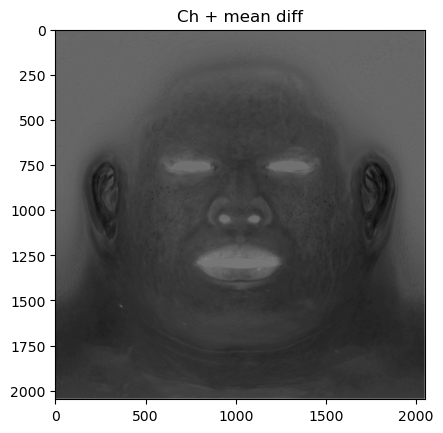

shape of recovered: (4194304, 3)


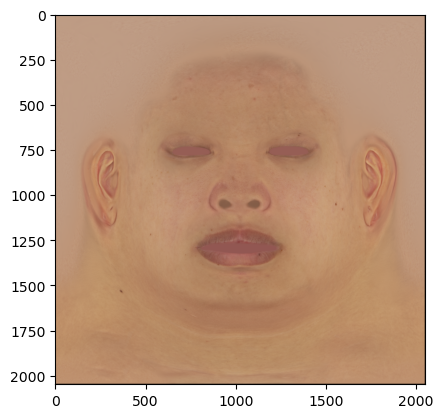

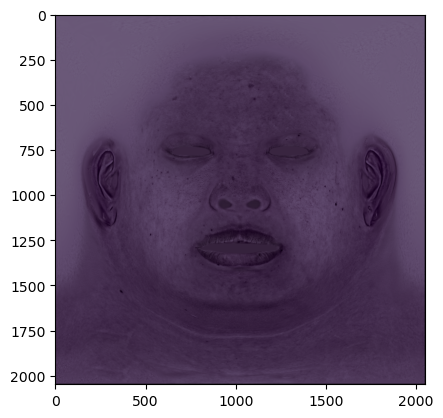

size of image: (2048, 2048, 3)
max pixel value: 0.5104068517684937
min pixel value: 0.0


In [ ]:
image_path = r"/Users/joeljohnson/Documents/Encoder_Decoder/AE_2023_06/models_4k/m53_4k.png"

image = Image.open(image_path).convert('RGB')
WIDTH = 2048
HEIGHT = 2048
image = cv2.resize(np.asarray(image), (WIDTH, HEIGHT))





image_numpy = image.reshape((WIDTH, HEIGHT, 3))
pred_maps, encode_time = encode(image_numpy)

"""
Cm = pred_maps[:,0]
Ch = pred_maps[:,1]
"""

plt.imshow(pred_maps[:,1].reshape(WIDTH, HEIGHT), cmap='binary')
plt.title("Ch")
plt.show()
sum_dif_ch = sum_dif_ch.reshape(WIDTH, HEIGHT)/idx
pred_maps[:,1]= np.abs(pred_maps[:,1], sum_dif_ch.reshape(-1))
plt.imshow(pred_maps[:,1].reshape(WIDTH, HEIGHT), cmap='binary')
plt.title("Ch + mean diff")
plt.show()

recovered, decode_time = decode(pred_maps)
print(f"shape of recovered: {recovered.shape}")
recovered = np.asarray(recovered).reshape((WIDTH, HEIGHT, 3))

# recovered_lab= colorspacious.cspace_convert(recovered, 'sRGB1', 'CAM02-UCS')
image = np.asarray(image).reshape((WIDTH, HEIGHT, 3))
plt.imshow(image)
plt.show()

# recovered = np.asarray(recovered).reshape((WIDTH, HEIGHT, 3))
recovered = np.clip(recovered/255.0, 0, 1)
plt.imshow(recovered)
plt.show()
#save the image 
#print size of image
print(f"size of image: {recovered.shape}")
#max min pixel values
print(f"max pixel value: {np.max(recovered)}")
print(f"min pixel value: {np.min(recovered)}")
#clamp the values to 0-1
# recovered = np.clip(recovered, 0, 1)
# experiment_name = input("Enter experiment name: ")
# file_NAME = f"{experiment_name}_{subjects_meta[idx]}.png"
# plt.imsave(file_NAME, recovered)

    